# 0) Setup

## 0.0) Imports

In [5]:
# Basic Imports
import numpy as np
import matplotlib.pyplot as plt
import pickle
import math
import copy

In [6]:
# Complicated Imports
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import einops
import tqdm.notebook as tqdm

import random
import time

#from google.colab import drive
from pathlib import Path
import os

from functools import *
import pandas as pd
import gc

import itertools

import matplotlib.pyplot as plt
%matplotlib inline


from torch.utils.data import DataLoader

from collections import defaultdict

## 0.1) Load Model

In [7]:
print ("This error is ok: 'fatal: destination path 'mechanistic_interpretability_challenge' already exists and is not an empty directory.'")
!git clone https://github.com/thestephencasper/mechanistic_interpretability_challenge.git


This error is ok: 'fatal: destination path 'mechanistic_interpretability_challenge' already exists and is not an empty directory.'


fatal: destination path 'mechanistic_interpretability_challenge' already exists and is not an empty directory.


In [8]:
p = 113  # the range of the model inputs
lr=5e-4
weight_decay = 1.0
d_model = 128 
frac_train = 0.5
num_epochs = 5000
stopping_thresh = -1
seed = 0
num_layers = 1
batch_style = 'full'
d_vocab = p + 1
n_ctx = 3
d_mlp = 8 * d_model  # 4*d_model
num_heads = 8 
assert d_model % num_heads == 0
d_head = d_model//num_heads
act_type = 'ReLU' # ['ReLU', 'GeLU']
use_ln = False

In [9]:
# A helper class to get access to intermediate activations (inspired by Garcon)
# It's a dummy module that is the identity function by default
# I can wrap any intermediate activation in a HookPoint and get a convenient 
# way to add PyTorch hooks
class HookPoint(nn.Module):
    def __init__(self):
        super().__init__()
        self.fwd_hooks = []
        self.bwd_hooks = []
    
    def give_name(self, name):
        # Called by the model at initialisation
        self.name = name
    
    def add_hook(self, hook, dir='fwd'):
        # Hook format is fn(activation, hook_name)
        # Change it into PyTorch hook format (this includes input and output, 
        # which are the same for a HookPoint)
        def full_hook(module, module_input, module_output):
            return hook(module_output, name=self.name)
        if dir=='fwd':
            handle = self.register_forward_hook(full_hook)
            self.fwd_hooks.append(handle)
        elif dir=='bwd':
            handle = self.register_backward_hook(full_hook)
            self.bwd_hooks.append(handle)
        else:
            raise ValueError(f"Invalid direction {dir}")
    
    def remove_hooks(self, dir='fwd'):
        if (dir=='fwd') or (dir=='both'):
            for hook in self.fwd_hooks:
                hook.remove()
            self.fwd_hooks = []
        if (dir=='bwd') or (dir=='both'):
            for hook in self.bwd_hooks:
                hook.remove()
            self.bwd_hooks = []
        if dir not in ['fwd', 'bwd', 'both']:
            raise ValueError(f"Invalid direction {dir}")
    
    def forward(self, x):
        return x

In [10]:
# Define network architecture

# Embed & Unembed
class Embed(nn.Module):
    def __init__(self, d_vocab, d_model):
        super().__init__()
        self.W_E = nn.Parameter(torch.randn(d_model, d_vocab)/np.sqrt(d_model))
    
    def forward(self, x):
        return torch.einsum('dbp -> bpd', self.W_E[:, x])

class Unembed(nn.Module):
    def __init__(self, d_vocab, d_model):
        super().__init__()
        self.W_U = nn.Parameter(torch.randn(d_model, d_vocab)/np.sqrt(d_vocab))
    
    def forward(self, x):
        return (x @ self.W_U)

# Positional Embeddings
class PosEmbed(nn.Module):
    def __init__(self, max_ctx, d_model):
        super().__init__()
        self.W_pos = nn.Parameter(torch.randn(max_ctx, d_model)/np.sqrt(d_model))
    
    def forward(self, x):
        return x+self.W_pos[:x.shape[-2]]

# LayerNorm
class LayerNorm(nn.Module):
    def __init__(self, d_model, epsilon = 1e-4, model=[None]):
        super().__init__()
        self.model = model
        self.w_ln = nn.Parameter(torch.ones(d_model))
        self.b_ln = nn.Parameter(torch.zeros(d_model))
        self.epsilon = epsilon
    
    def forward(self, x):
        if self.model[0].use_ln:
            x = x - x.mean(axis=-1)[..., None]
            x = x / (x.std(axis=-1)[..., None] + self.epsilon)
            x = x * self.w_ln
            x = x + self.b_ln
            return x
        else:
            return x

# Attention
class Attention(nn.Module):
    def __init__(self, d_model, num_heads, d_head, n_ctx, model):
        super().__init__()
        self.model = model
        self.W_K = nn.Parameter(torch.randn(num_heads, d_head, d_model)/np.sqrt(d_model))
        self.W_Q = nn.Parameter(torch.randn(num_heads, d_head, d_model)/np.sqrt(d_model))
        self.W_V = nn.Parameter(torch.randn(num_heads, d_head, d_model)/np.sqrt(d_model))
        self.W_O = nn.Parameter(torch.randn(d_model, d_head * num_heads)/np.sqrt(d_model))
        self.register_buffer('mask', torch.tril(torch.ones((n_ctx, n_ctx))))
        self.d_head = d_head
        self.hook_k = HookPoint()
        self.hook_q = HookPoint()
        self.hook_v = HookPoint()
        self.hook_z = HookPoint()
        self.hook_attn = HookPoint()
        self.hook_attn_pre = HookPoint()

    def forward(self, x):
        k = self.hook_k(torch.einsum('ihd,bpd->biph', self.W_K, x))
        q = self.hook_q(torch.einsum('ihd,bpd->biph', self.W_Q, x))
        v = self.hook_v(torch.einsum('ihd,bpd->biph', self.W_V, x))
        attn_scores_pre = torch.einsum('biph,biqh->biqp', k, q)
        attn_scores_masked = torch.tril(attn_scores_pre) - 1e10 * (1 - self.mask[:x.shape[-2], :x.shape[-2]])
        attn_matrix = self.hook_attn(F.softmax(self.hook_attn_pre(attn_scores_masked/np.sqrt(self.d_head)), dim=-1))
        z = self.hook_z(torch.einsum('biph,biqp->biqh', v, attn_matrix))
        z_flat = einops.rearrange(z, 'b i q h -> b q (i h)')
        out = torch.einsum('df,bqf->bqd', self.W_O, z_flat)
        return out

# MLP Layers
class MLP(nn.Module):
    def __init__(self, d_model, d_mlp, act_type, model):
        super().__init__()
        self.model = model
        self.W_in = nn.Parameter(torch.randn(d_mlp, d_model)/np.sqrt(d_model))
        self.b_in = nn.Parameter(torch.zeros(d_mlp))
        self.W_out = nn.Parameter(torch.randn(d_model, d_mlp)/np.sqrt(d_model))
        self.b_out = nn.Parameter(torch.zeros(d_model))
        self.act_type = act_type
        # self.ln = LayerNorm(d_mlp, model=self.model)
        self.hook_pre = HookPoint()
        self.hook_post = HookPoint()
        assert act_type in ['ReLU', 'GeLU']
        
    def forward(self, x):
        x = self.hook_pre(torch.einsum('md,bpd->bpm', self.W_in, x) + self.b_in)
        if self.act_type=='ReLU':
            x = F.relu(x)
        elif self.act_type=='GeLU':
            x = F.gelu(x)
        x = self.hook_post(x)
        x = torch.einsum('dm,bpm->bpd', self.W_out, x) + self.b_out
        return x

# Transformer Block
class TransformerBlock(nn.Module):
    def __init__(self, d_model, d_mlp, d_head, num_heads, n_ctx, act_type, model):
        super().__init__()
        self.model = model
        # self.ln1 = LayerNorm(d_model, model=self.model)
        self.attn = Attention(d_model, num_heads, d_head, n_ctx, model=self.model)
        # self.ln2 = LayerNorm(d_model, model=self.model)
        self.mlp = MLP(d_model, d_mlp, act_type, model=self.model)
        self.hook_attn_out = HookPoint()
        self.hook_mlp_out = HookPoint()
        self.hook_resid_pre = HookPoint()
        self.hook_resid_mid = HookPoint()
        self.hook_resid_post = HookPoint()
    
    def forward(self, x):
        x = self.hook_resid_mid(x + self.hook_attn_out(self.attn((self.hook_resid_pre(x)))))
        x = self.hook_resid_post(x + self.hook_mlp_out(self.mlp((x))))
        return x

# Full transformer
class Transformer(nn.Module):
    def __init__(self, num_layers, d_vocab, d_model, d_mlp, d_head, num_heads, n_ctx, act_type, use_cache=False, use_ln=True):
        super().__init__()
        self.cache = {}
        self.use_cache = use_cache

        self.embed = Embed(d_vocab, d_model)
        self.pos_embed = PosEmbed(n_ctx, d_model)
        self.blocks = nn.ModuleList([TransformerBlock(d_model, d_mlp, d_head, num_heads, n_ctx, act_type, model=[self]) for i in range(num_layers)])
        # self.ln = LayerNorm(d_model, model=[self])
        self.unembed = Unembed(d_vocab, d_model)
        self.use_ln = use_ln

        for name, module in self.named_modules():
            if type(module)==HookPoint:
                module.give_name(name)
    
    def forward(self, x):
        x = self.embed(x)
        x = self.pos_embed(x)
        for block in self.blocks:
            x = block(x)
        # x = self.ln(x)
        x = self.unembed(x)
        return x

    def set_use_cache(self, use_cache):
        self.use_cache = use_cache
    
    def hook_points(self):
        return [module for name, module in self.named_modules() if 'hook' in name]

    def remove_all_hooks(self):
        for hp in self.hook_points():
            hp.remove_hooks('fwd')
            hp.remove_hooks('bwd')
    
    def cache_all(self, cache, incl_bwd=False):
        # Caches all activations wrapped in a HookPoint
        def save_hook(tensor, name):
            cache[name] = tensor.detach()
        def save_hook_back(tensor, name):
            cache[name+'_grad'] = tensor[0].detach()
        for hp in self.hook_points():
            hp.add_hook(save_hook, 'fwd')
            if incl_bwd:
                hp.add_hook(save_hook_back, 'bwd')

In [11]:
model = Transformer(num_layers=num_layers, 
                    d_vocab=d_vocab, 
                    d_model=d_model, 
                    d_mlp=d_mlp, 
                    d_head=d_head, 
                    num_heads=num_heads, 
                    n_ctx=n_ctx, 
                    act_type=act_type, 
                    use_cache=False, 
                    use_ln=use_ln)
model.to('cuda')

Transformer(
  (embed): Embed()
  (pos_embed): PosEmbed()
  (blocks): ModuleList(
    (0): TransformerBlock(
      (attn): Attention(
        (hook_k): HookPoint()
        (hook_q): HookPoint()
        (hook_v): HookPoint()
        (hook_z): HookPoint()
        (hook_attn): HookPoint()
        (hook_attn_pre): HookPoint()
      )
      (mlp): MLP(
        (hook_pre): HookPoint()
        (hook_post): HookPoint()
      )
      (hook_attn_out): HookPoint()
      (hook_mlp_out): HookPoint()
      (hook_resid_pre): HookPoint()
      (hook_resid_mid): HookPoint()
      (hook_resid_post): HookPoint()
    )
  )
  (unembed): Unembed()
)

In [12]:
save_dict = torch.load('mechanistic_interpretability_challenge/transformer_model.pt')
model.load_state_dict(save_dict['model'])

<All keys matched successfully>

# 1) Call Model and get activations and outputs

## 1.0) Ground Truth

In [13]:
def label_fn(x, y):
    z = 0
    if x ** 2 < np.sqrt(y) * 200:
        z += 3
    if y ** 2 < np.sqrt(x) * 600:
        z -= 2
    z += int(x ** 1.5) % 8 - 5
    if y < (p - x + 20) and z < -3:
        z += 5.5
    if z < 0:
        return 0
    else:
        return 1

labels = np.zeros((p, p))
for x in range(p):
    for y in range(p):
        labels[x][y] = label_fn(x, y)

## 1.1) Call model

In [14]:
all_pairs = [(i, j, p) for i in range(p) for j in range(p)]
all_inputs = torch.tensor([[point[0], point[1], 113] for point in all_pairs], dtype=torch.long)
activations = defaultdict(dict)
model.cache_all(activations, incl_bwd=False)
with torch.no_grad():
    output = model(all_inputs)


In [15]:
print(output.shape)
model_prediction = output[:,2,1] > output[:,2,0] 
model_prediction = model_prediction.reshape(113,113)
print (model_prediction.shape)

model_prediction_np = model_prediction.cpu().numpy()

torch.Size([12769, 3, 114])
torch.Size([113, 113])


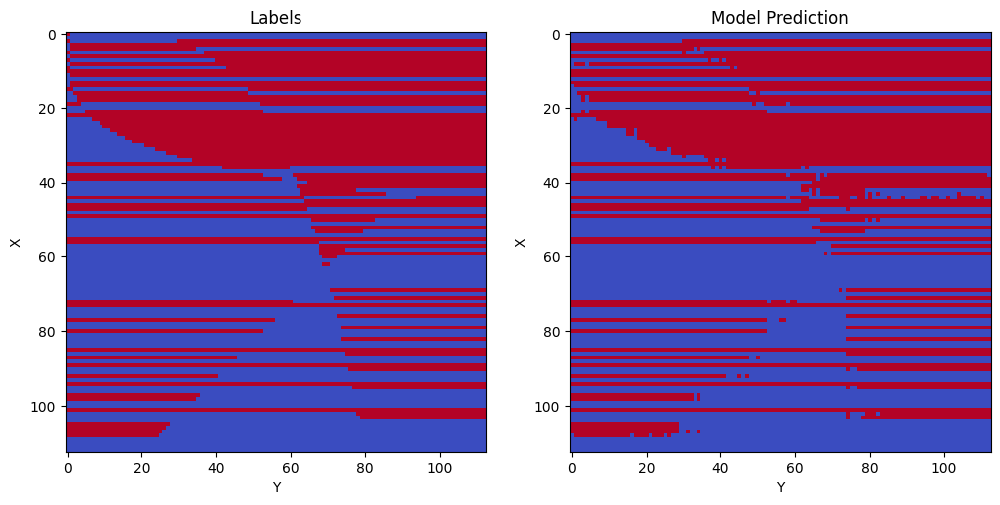

In [74]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

ax[0].imshow(labels, cmap='coolwarm')
ax[0].set_xlabel('Y')
ax[0].set_ylabel('X')
ax[0].set_title('Labels')

ax[1].imshow(model_prediction_np, cmap='coolwarm')
ax[1].set_xlabel('Y')
ax[1].set_ylabel('X')
ax[1].set_title('Model Prediction')

plt.show()

# 2) Analysis Helper Functions

## 2.0) GT Curves

In [17]:
x_linspace = np.round(np.linspace(0, p-1, p)).astype(int) 
y_dependent = np.sqrt(np.sqrt(x_linspace) * 600)

y_indep2 = range(113)
x_dependent_f2 = np.sqrt(np.sqrt(y_indep2)*200)

x_line = x_linspace[20:]
y_line = 132-x_linspace[20:]

In [18]:
def add_curves_to_axis(ax, ygap = 0, color = 'r'):
    ax.plot([i + ygap for i in y_dependent],x_linspace, 'purple') 
    ax.plot([i + ygap for i in y_indep2], x_dependent_f2, 'g')
    ax.plot([i + ygap for i in y_line], x_line, 'orange')

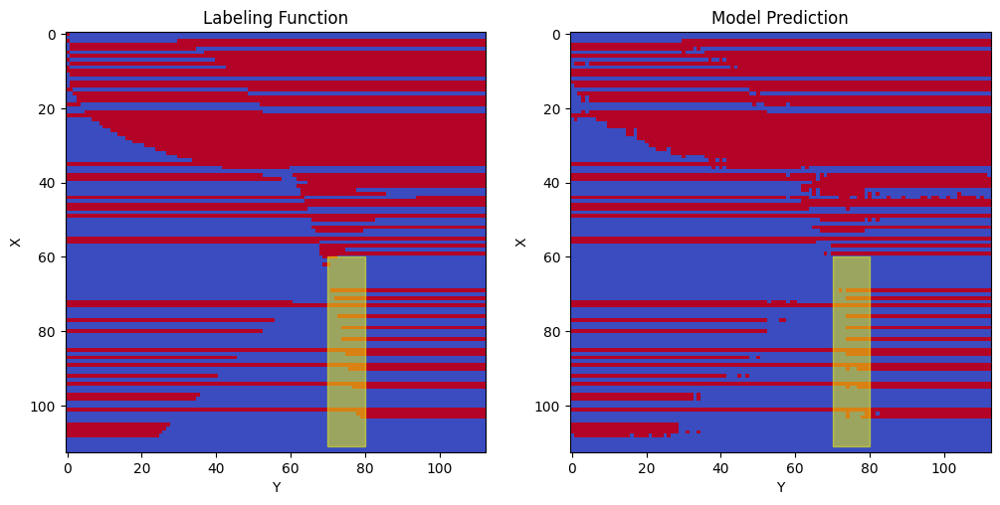

In [19]:
import matplotlib.patches as patches


fig, ax = plt.subplots(1, 2, figsize=(12, 6))

ax[0].imshow(labels, cmap='coolwarm')
ax[0].set_xlabel('Y')
ax[0].set_ylabel('X')
ax[0].set_title('Labeling Function')
# add_curves_to_axis(ax[0])

ax[1].imshow(model_prediction.detach().cpu().numpy(), cmap='coolwarm')
ax[1].set_xlabel('Y')
ax[1].set_ylabel('X')
ax[1].set_title('Model Prediction')
# add_curves_to_axis(ax[1])


# create the rectangle (or box)
rect = patches.Rectangle((70, 60), 10, 51, linewidth=1, edgecolor='yellow', facecolor='yellow', alpha=0.5)

# add the rectangle to the plot
ax[0].add_patch(rect)
rect = patches.Rectangle((70, 60), 10, 51, linewidth=1, edgecolor='yellow', facecolor='yellow', alpha=0.5)
ax[1].add_patch(rect)

plt.show()

## 2.1) Cutoffs from a different project.
File is on github.

In [20]:
import pickle

# Opening the pickle file
with open('variables.pkl', 'rb') as f:
    E_variables = pickle.load(f)

# Now you can access your variables as follows:
E2 = E_variables['E2']
E0 = E_variables['E0']
E1 = E_variables['E1']
E3 = E_variables['E3']

E0_left = 1.0*(E0[:,0] > 0) -1.0* (E0[:,0] < 0)
E0_right = 1.0*(E0[:,-1] > 0) -1.0* (E0[:,-1] < 0)

E1_left = 1.0*(E1[:,0] > 0) -1.0* (E1[:,0] < 0)
E1_right = 1.0*(E1[:,-1] > 0) -1.0* (E1[:,-1] < 0)

E2_left = 1.0*(E2[:,0] > 0) -1.0* (E2[:,0] < 0)
E2_right = 1.0*(E2[:,-1] > 0) -1.0* (E2[:,-1] < 0)

E3_left = 1.0*(E3[:,0] > 0) -1.0* (E3[:,0] < 0)
E3_right = 1.0*(E3[:,-1] > 0) -1.0* (E3[:,-1] < 0)

Ex = 0.0*(E0[:,0] < 0)

def extend_info(to_plot, vmin_to_0):
    if vmin_to_0:
        return to_plot
    
    max_abs = np.max(np.abs(to_plot))

    info_extended = np.hstack([max_abs*E3_left.reshape(-1, 1), max_abs*E3_right.reshape(-1, 1), \
                               max_abs*E0_left.reshape(-1, 1), max_abs*E0_right.reshape(-1, 1), \
                               max_abs*E1_left.reshape(-1, 1), max_abs*E1_right.reshape(-1, 1), \
                               max_abs*E2_left.reshape(-1, 1), max_abs*E2_right.reshape(-1, 1), Ex.reshape(-1, 1),\
                               to_plot, \
                               Ex.reshape(-1, 1), max_abs*E3_left.reshape(-1, 1), max_abs*E3_right.reshape(-1, 1), \
                               max_abs*E0_left.reshape(-1, 1), max_abs*E0_right.reshape(-1, 1), \
                               max_abs*E1_left.reshape(-1, 1), max_abs*E1_right.reshape(-1, 1), \
                               max_abs*E2_left.reshape(-1, 1), max_abs*E2_right.reshape(-1, 1), \
                              ])

    return info_extended

In [21]:
# 10 different masking rules that will be used when plotting; based on GT.
rules_3 = np.zeros((10,113))

rules_3[0] = (E3_left == -1)                                     # all blue
rules_3[1] = (E3_left ==  1)                                     # all red
rules_3[2] = ((E0_left ==  1) & (E1_left == 0))                  # rbXXXX
rules_3[3] = ((E0_left ==  1) & (E1_left == -1))                 # rbbrXX
rules_3[4] = ((E0_left == -1) & (E1_left == 0))                  # brXXXX
rules_3[5] = ((E0_left == -1) & (E1_left == 1))                  # brrbXX
rules_3[6] = ((E1_left == -1) & (E0_left == 0) & (E2_left == 0)) # XXbrXX
rules_3[7] = ((E1_left ==  1) & (E0_left == 0) & (E2_left == 0)) # XXrbXX
rules_3[8] = ((E1_left == -1) & (E2_left == 1))                  # XXbrrb
rules_3[9] = ((E2_left == 1) &  (E1_left == 0))                  # XXXXrb

## 2.3) Ploting Utils

In [22]:
def quick_plot_4(ax, info, name, max_override=None, V=0, V12keep = None, vmin_to_0 = False):
    abs_max = np.max(np.abs(info))

    info = extend_info(info, vmin_to_0)

    abs_max = np.max(np.abs(info))
    if max_override != None:
        abs_max = max_override
    
    if V == 1 or V == 2:
        dontkeep = copy.copy(info)
        if V12keep == None:
#             V12keep = [2,4,5,7,9,15,16,19,21,36,38,39,42,43,44,50,53,58,60,62]
            V12keep = [36,50]
        dontkeep[V12keep,:] = 0
        info -= dontkeep   
    
    if vmin_to_0:
        im = ax.imshow(info, cmap='coolwarm', interpolation='nearest', vmin=0, vmax=abs_max)
    else:
        im = ax.imshow(info, cmap='coolwarm', interpolation='nearest', vmin=-abs_max, vmax=abs_max)
    
    if V == 2:
        im = ax.imshow(dontkeep, cmap='coolwarm', interpolation='nearest', vmin=-abs_max, vmax=abs_max)
    
    ax.set_title(f"{name}")
    ax.figure.colorbar(im, ax=ax)
    ax.set_xlabel("Y")
    ax.set_ylabel("X")
    
    if vmin_to_0:
        add_curves_to_axis(ax, 0, color="g")
    else:
        add_curves_to_axis(ax, 9, color="g")

In [23]:
# Helper function for plotting.
def get_indices(lst, val, minx = -1, maxx = 200):
    return [i for i, x in enumerate(lst) if x == val and i >= minx and i <= maxx]

# 3a) First contribution

In [24]:
unembed_favoring_1 = model.unembed.W_U[:,1]-model.unembed.W_U[:,0]
print(unembed_favoring_1.shape)
print(model.blocks[0].mlp.W_out.shape)

MLPin_neuron_to_unembed = torch.einsum('ab,a->b',model.blocks[0].mlp.W_out,unembed_favoring_1)
print(MLPin_neuron_to_unembed.shape)

unembed_original = torch.einsum("bn,n->bn",activations['blocks.0.mlp.hook_post'][:,2,:],MLPin_neuron_to_unembed)

torch.Size([128])
torch.Size([128, 1024])
torch.Size([1024])


In [25]:
# MATH _ do I need all of this?

def score(i):
    return sum(sum((overall>i) == labels))/113.0/113.0

import numpy as np

def get_max_score(data):
    return sum(sum(((data > 0) == (labels == 1.0))))
    
    
#     np_array = data

#     true_values = np_array[labels_bool]
#     false_values = np_array[~labels_bool]


#     # create histogram data
#     true_counts, bin_edges = np.histogram(true_values, bins=np.arange(-20, 20.1, 0.1))
#     false_counts, bin_edges = np.histogram(false_values, bins=np.arange(-20, 20.1, 0.1))

# #     delta = np.zeros((len(true_counts)))
# #     for i in range(len(true_counts)):
# #         delta[i] =  true_counts[i] - false_counts[i]

#     max_score = 0
#     cur_score = sum(true_counts)
#     for i in range(len(true_counts)):
#         cur_score = cur_score - true_counts[i] + false_counts[i]
#         max_score = max(cur_score, max_score)
#     return(max_score)

def get_max_match(data):
    return sum(sum((data > 0) == model_prediction.detach().cpu().numpy()))
    
#     np_array = data

#     true_values = np_array[model_prediction.detach().cpu().numpy()]
#     false_values = np_array[~model_prediction.detach().cpu().numpy()]

#     # create histogram data
#     true_counts, bin_edges = np.histogram(true_values, bins=np.arange(-20, 20.1, 0.1))
#     false_counts, bin_edges = np.histogram(false_values, bins=np.arange(-20, 20.1, 0.1))

# #     delta = np.zeros((len(true_counts)))
# #     for i in range(len(true_counts)):
# #         delta[i] =  true_counts[i] - false_counts[i]

#     max_score = 0
#     cur_score = sum(true_counts)
#     cutoff = -99
#     for i in range(len(true_counts)):
#         cur_score = cur_score - true_counts[i] + false_counts[i]
#         if cur_score > max_score:
#             cutoff = bin_edges[i]
#         max_score = max(cur_score, max_score)
#     return(max_score,cutoff)

print(get_max_score(unembed_original[:,1].reshape(113,113).detach().cpu().numpy()))
print(get_max_match(unembed_original[:,1].reshape(113,113).detach().cpu().numpy()))
               
               


7304
7342


In [26]:
import matplotlib.pyplot as plt
import torch

overall = np.zeros((113,113))

RR = []
RL = []
BL = []
BR = []
R2 = []



for i in range(1024):
    to_plot = unembed_original[:,i].reshape(113,113).detach().cpu().numpy()
    
    formatted_i = "{:04d}".format(i)
    
    abs_max = np.max(np.abs(to_plot))
    
    if abs_max < .5:
        continue
    
    if abs_max == np.max(to_plot):
        color = "R"
        if sum(abs(to_plot[:,0])) > sum(abs(to_plot[:,-1])):
            left_or_right = "L"
            # I hand sorted all reds
            if i in [37,65,78, 223, 296, 506, 825, 875, 893, 919, 929]:
                R2.append(i)
            else:
                RL.append(i)
        else:
            left_or_right = "R"
            if i in [37,65,78, 223, 296, 506, 825, 875, 893, 919, 929]:
                R2.append(i)
            else:
                RR.append(i)
    else:
        color = "B"
        if sum(abs(to_plot[:,0])) > sum(abs(to_plot[:,-1])):
            left_or_right = "L"
            BL.append(i)
        else:
            left_or_right = "R"
            BR.append(i)
            
            
#     fig, ax = plt.subplots(figsize=(10,10))
#     quick_plot_4(ax, to_plot, formatted_i, V=0)
#     plt.show()


In [27]:
# Not sure if this is deterministic...

best_indices = 0
best_score = 0
for i in range(10000):
    if i % 500 == 0:
        print(i)
        print(best_score, best_indices)


    if False:
        rr_int = random.choice(RR)
        r2_int = random.choice(R2)
        bl_int = random.choice(BL)
        br_int = random.choice(BR)

        combined_list = [rr_int, r2_int, bl_int, br_int]
    else:
        rr_int = 632
        r2_int = 78
        bl_int = random.choice(BL)
        br_int = random.choice(BR)

        combined_list = [rr_int, r2_int, bl_int, br_int]

       # combined_list = rr_int +  bl_int + br_int # + rl_int        

#     print(combined_list)

    overall = np.zeros((113,113))

    for index in combined_list:
        overall += unembed_original[:,index].reshape(113,113).detach().cpu().numpy()

    score= get_max_match(overall)
    score = score/113.0/113.0
    if score > best_score:
        best_score = score
        best_indices = combined_list
    
print(best_score, best_indices)

0
0 0
500
0.9840238076591746 [632, 78, 98, 877]
1000
0.9870780797243324 [632, 78, 397, 877]
1500
0.9870780797243324 [632, 78, 397, 877]
2000
0.9870780797243324 [632, 78, 397, 877]
2500
0.9870780797243324 [632, 78, 397, 877]
3000
0.9870780797243324 [632, 78, 397, 877]
3500
0.9870780797243324 [632, 78, 397, 877]
4000
0.9870780797243324 [632, 78, 397, 877]
4500
0.9870780797243324 [632, 78, 397, 877]
5000
0.9870780797243324 [632, 78, 397, 877]
5500
0.9870780797243324 [632, 78, 397, 877]
6000
0.9870780797243324 [632, 78, 397, 877]
6500
0.9870780797243324 [632, 78, 397, 877]
7000
0.9870780797243324 [632, 78, 397, 877]
7500
0.9870780797243324 [632, 78, 397, 877]
8000
0.9870780797243324 [632, 78, 397, 877]
8500
0.9870780797243324 [632, 78, 397, 877]
9000
0.9870780797243324 [632, 78, 397, 877]
9500
0.9870780797243324 [632, 78, 397, 877]
0.9870780797243324 [632, 78, 397, 877]


In [28]:
overall = np.zeros((113,113))
for index in best_indices:
    overall += unembed_original[:,index].reshape(113,113).detach().cpu().numpy()

score = get_max_score(overall)
match = get_max_match(overall)
print(score/113.0/113.0,match/113.0/113.0)



0.9776803195238468 0.9870780797243324


In [29]:
overall_save_location = "betterNs"

if not os.path.exists(overall_save_location):
    os.makedirs(overall_save_location)
    
if not os.path.exists(overall_save_location+"BL"):
    os.makedirs(overall_save_location+"BL")
    
if not os.path.exists(overall_save_location+"RL"):
    os.makedirs(overall_save_location+"RL")
    
if not os.path.exists(overall_save_location+"BR"):
    os.makedirs(overall_save_location+"BR")
    
if not os.path.exists(overall_save_location+"RR"):
    os.makedirs(overall_save_location+"RR")
    
if not os.path.exists(overall_save_location+"R2"):
    os.makedirs(overall_save_location+"R2")

# Regular plots.

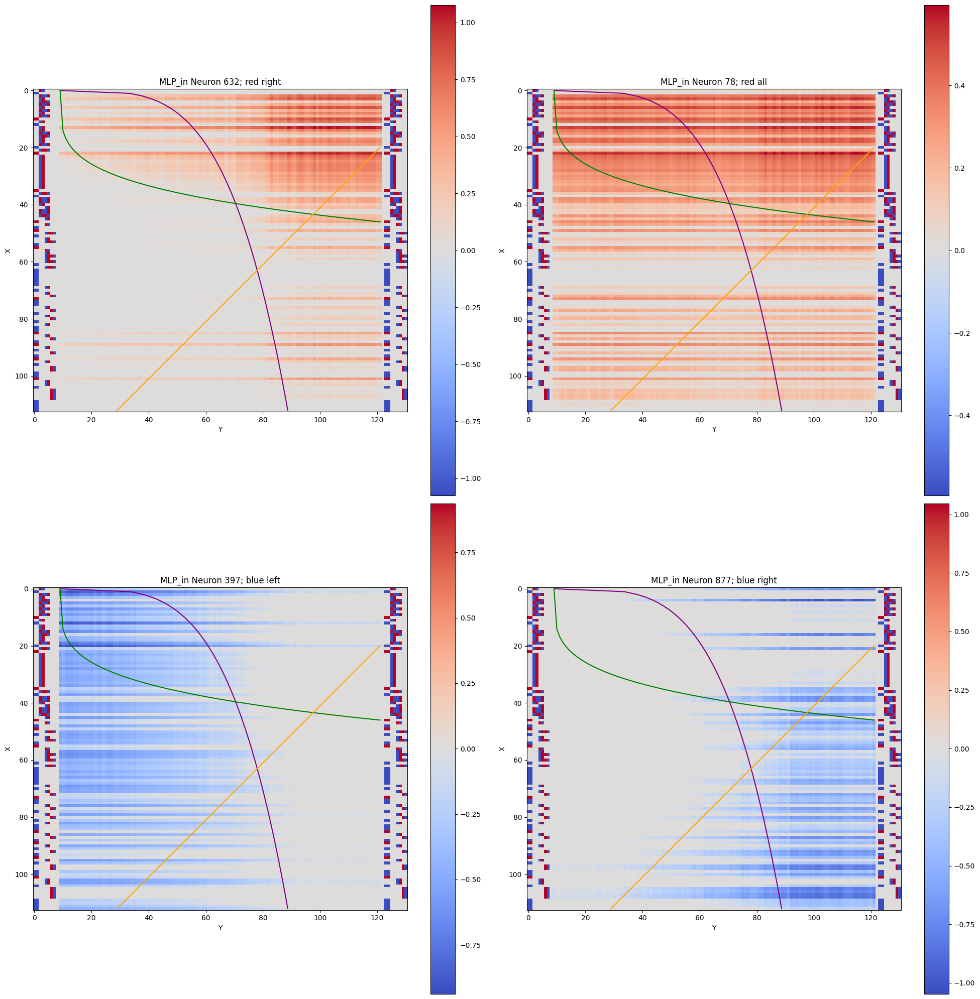

In [30]:
import numpy as np

fig, axs = plt.subplots(2, 2, figsize=(20,20)) # 2 rows, 2 columns
axs = axs.flatten() # Flatten to easily index into axs

v = 0

for i, index in enumerate(best_indices):
    to_plot = unembed_original[:,index].reshape(113,113).detach().cpu().numpy()
    formatted_i = "MLP_in Neuron {:04d}".format(index)

    if v == 0:
        title = formatted_i
    elif v == 1:
        title = f"Hard Rows {formatted_i}"
    else:
        title = f"Easy Rows {formatted_i}"

    quick_plot_4(axs[i], to_plot, title, V=v)

    axs[0].set_title("MLP_in Neuron 632; red right")
    axs[1].set_title("MLP_in Neuron 78; red all")
    axs[2].set_title("MLP_in Neuron 397; blue left")
    axs[3].set_title("MLP_in Neuron 877; blue right")
    
# Display all plots in the 2x2 grid
plt.tight_layout()
plt.show()

## 3b) additional plots

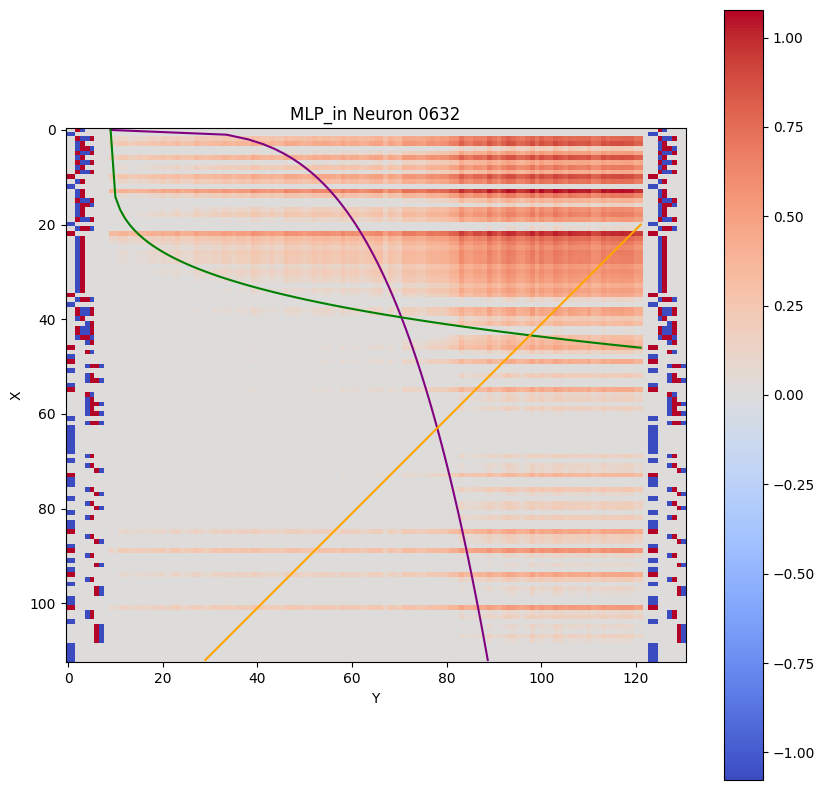

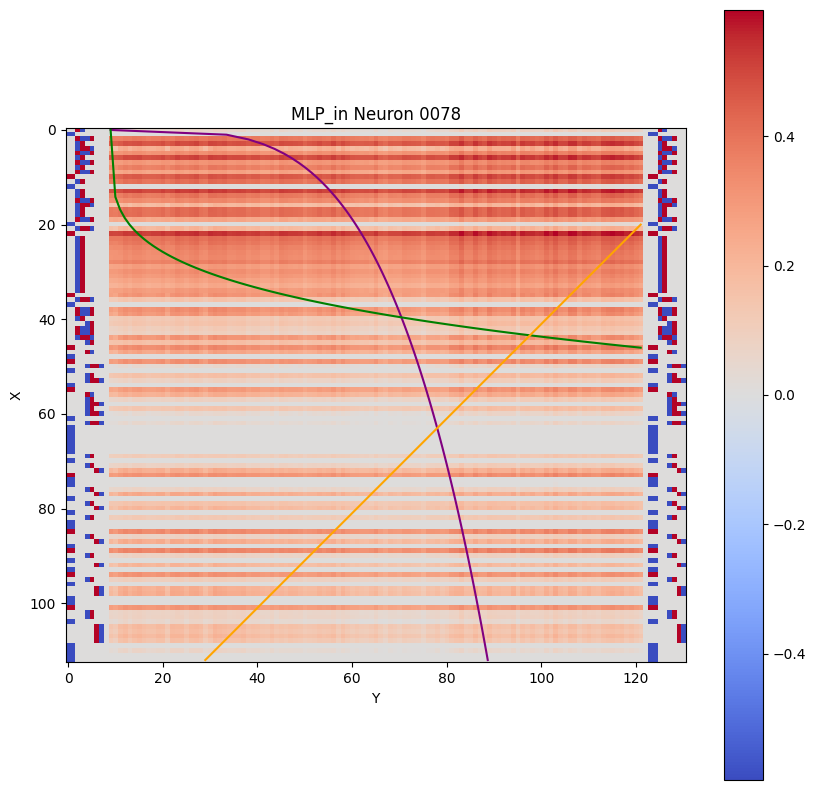

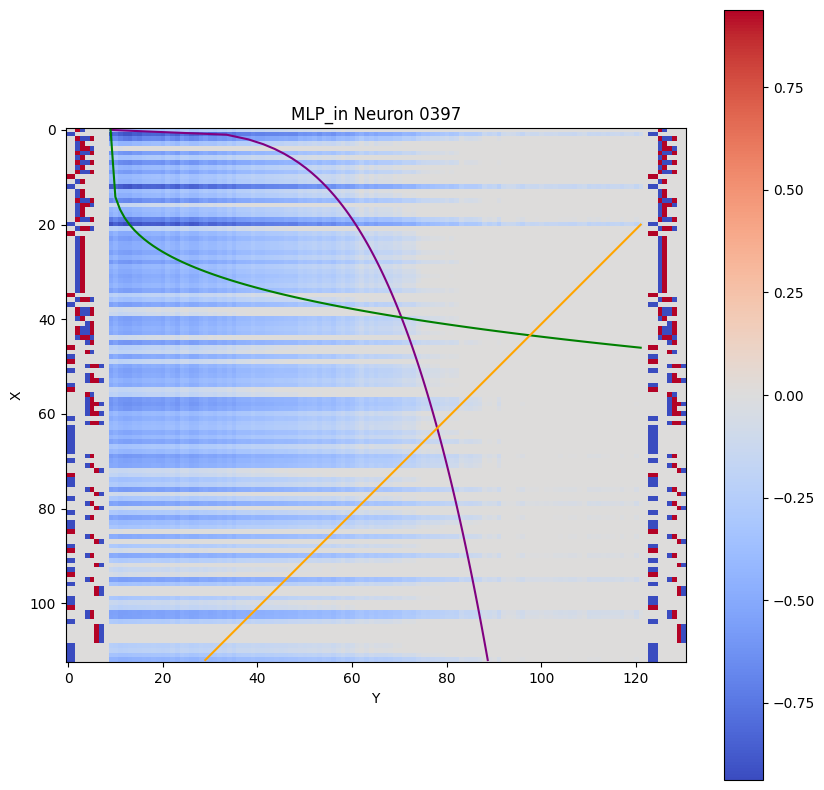

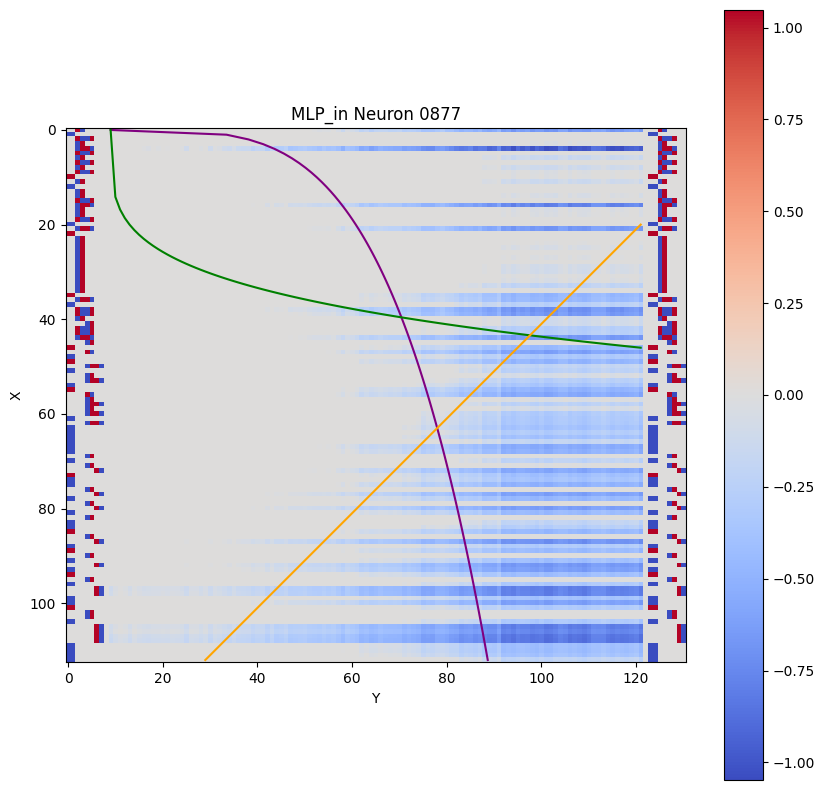

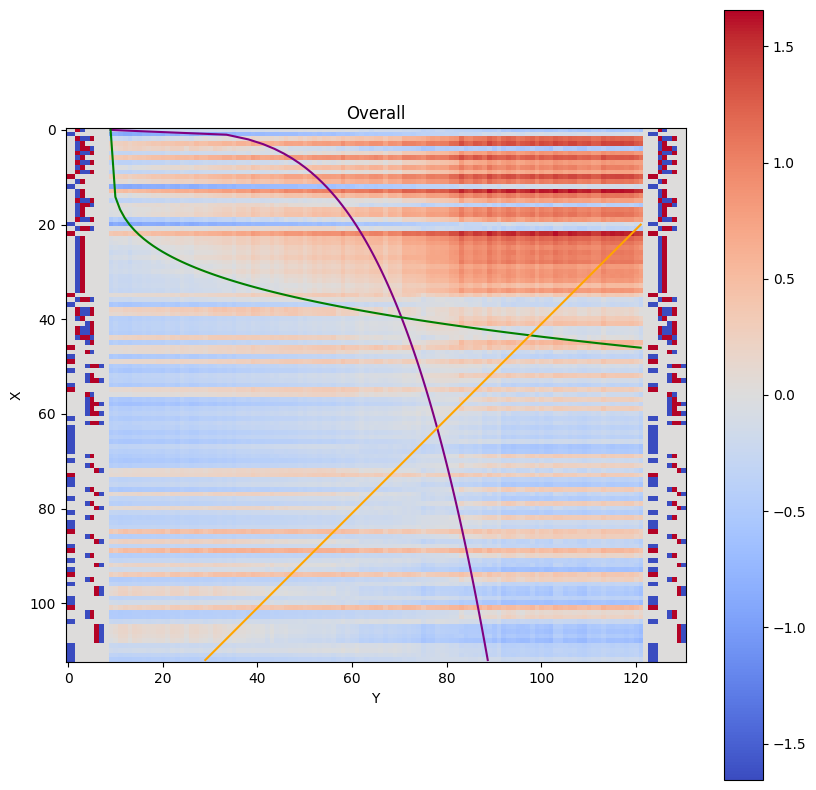

...

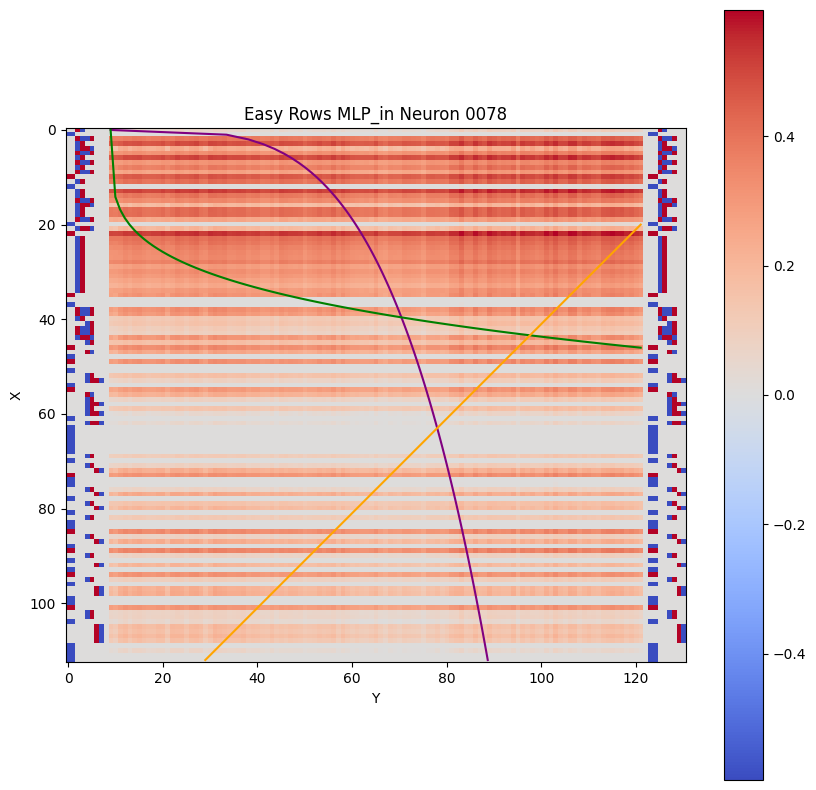

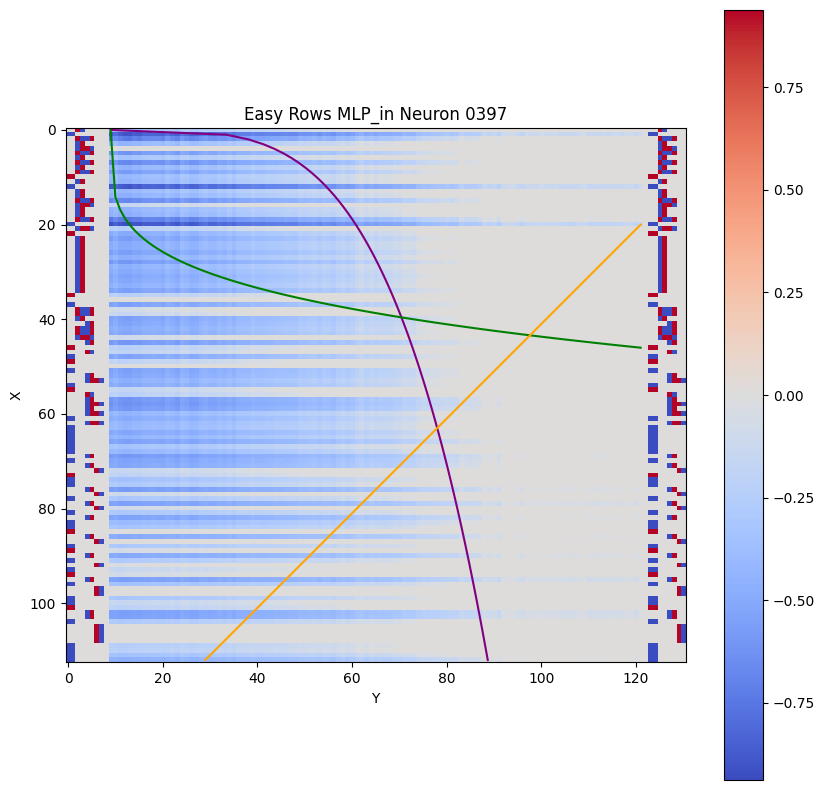

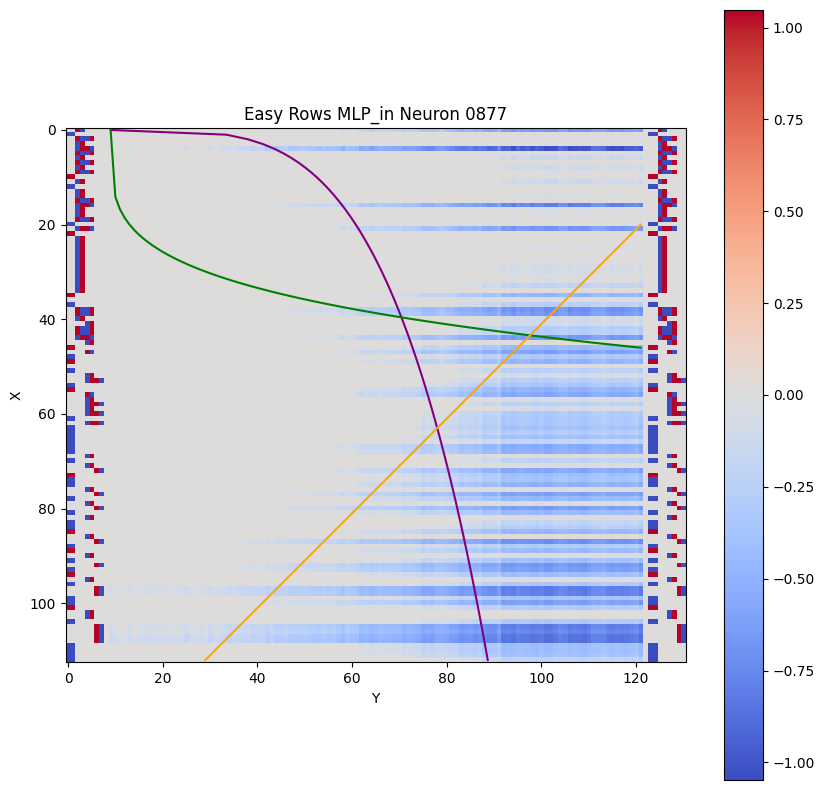

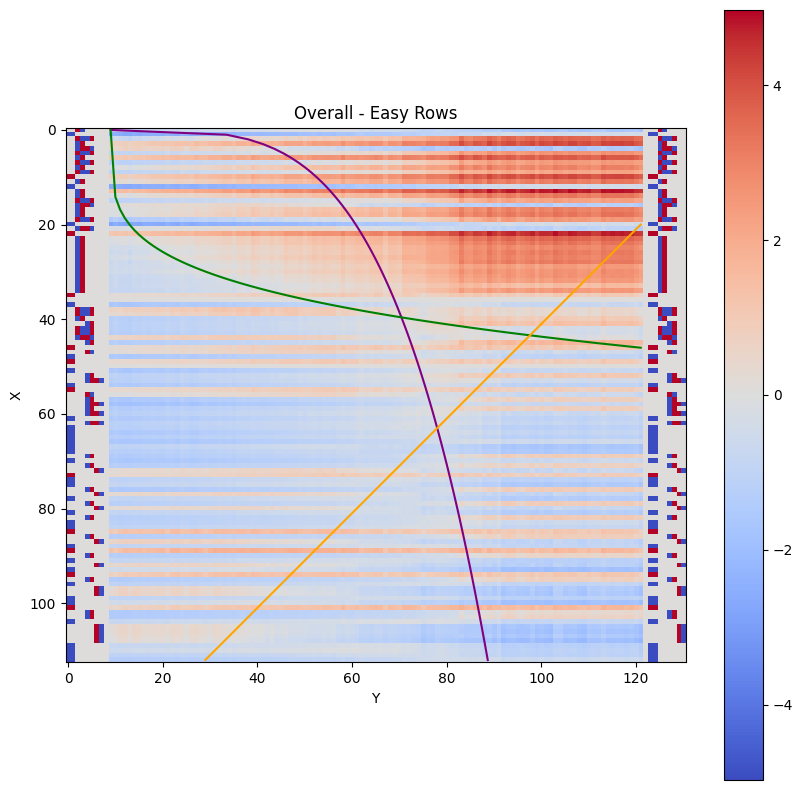

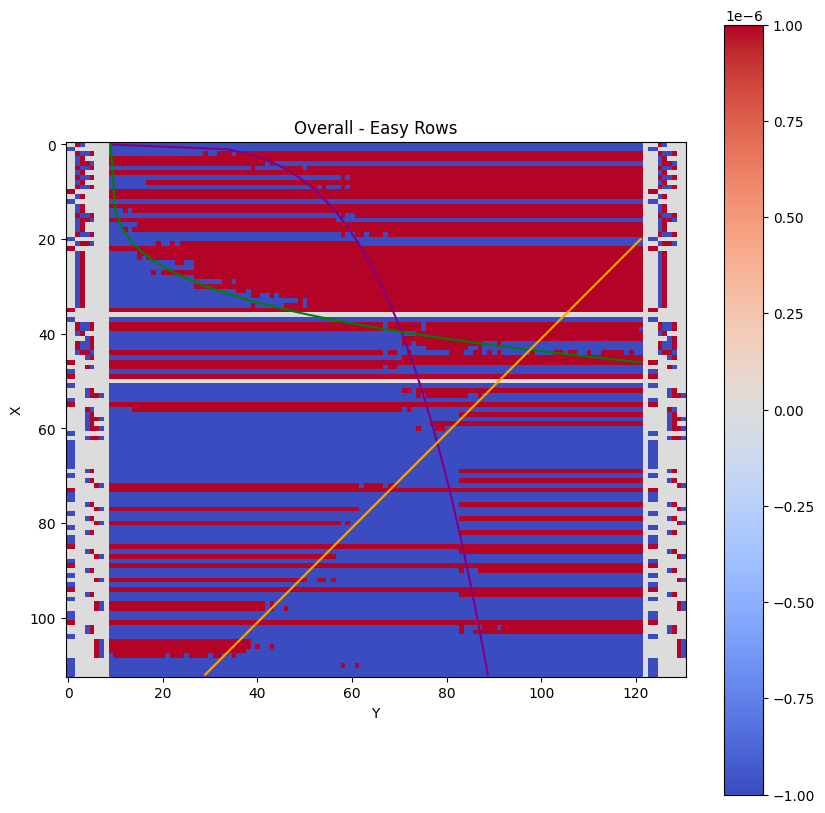

In [31]:
overall = np.zeros((113,113))

for v in range(3):
    for i in best_indices:
        to_plot = unembed_original[:,i].reshape(113,113).detach().cpu().numpy()

        formatted_i = "MLP_in Neuron {:04d}".format(i)

        overall += to_plot
        # To use the function
        if v == 0:
            title = formatted_i
        elif v == 1:
            title = f"Hard Rows {formatted_i}"
        else:
            title = f"Easy Rows {formatted_i}"
            
        fig, ax = plt.subplots(figsize=(10,10))
        quick_plot_4(ax, to_plot, title, V=v)
        plt.show()
        
    if v == 0:
        title = "Overall"
    elif v == 1:
        title = f"Overall - Hard Rows"
    else:
        title = f"Overall - Easy Rows"
        
    fig, ax = plt.subplots(figsize=(10,10))
    quick_plot_4(ax, overall, title, V=v)
    plt.show()
    fig, ax = plt.subplots(figsize=(10,10))
    quick_plot_4(ax, overall, title, V=v, max_override = .000001)
    plt.show()
    

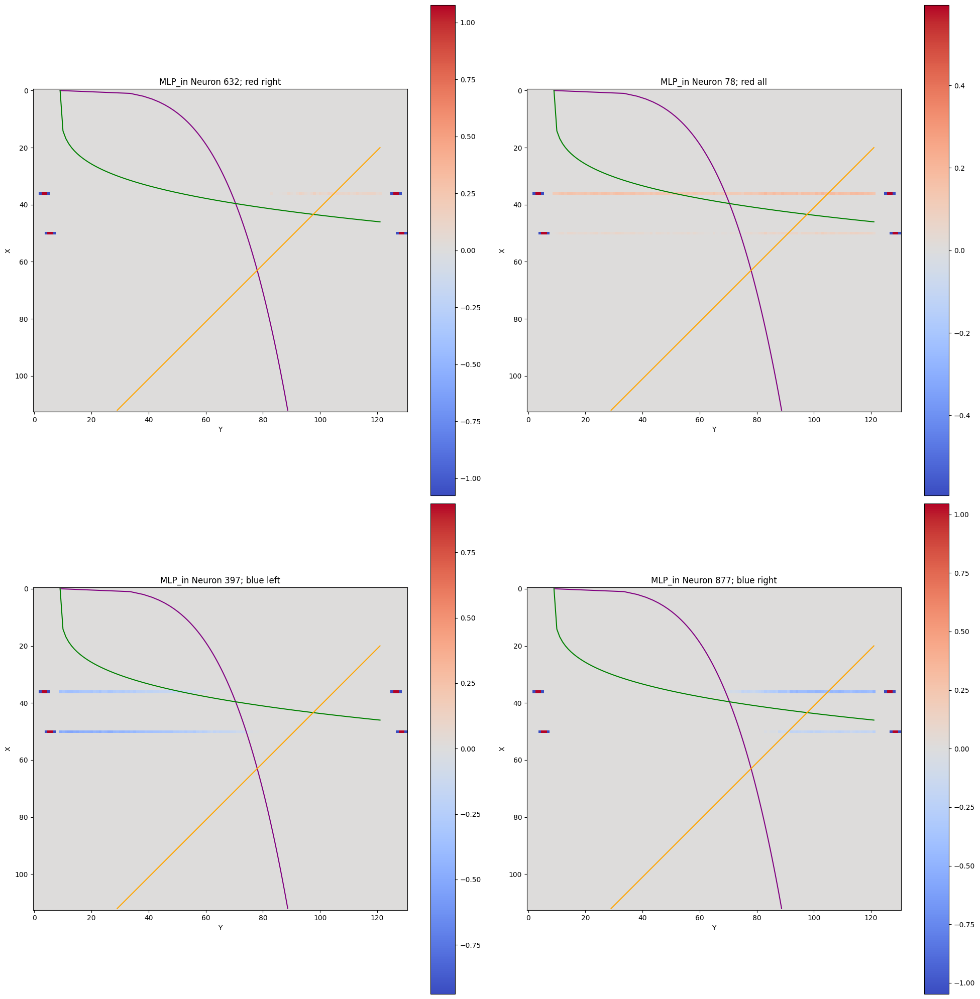

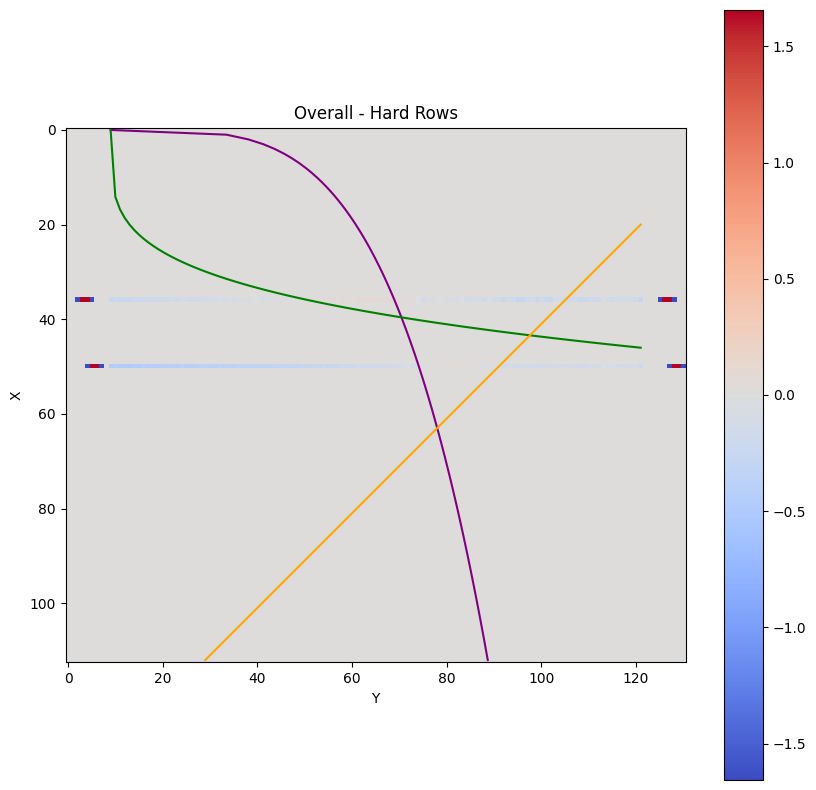

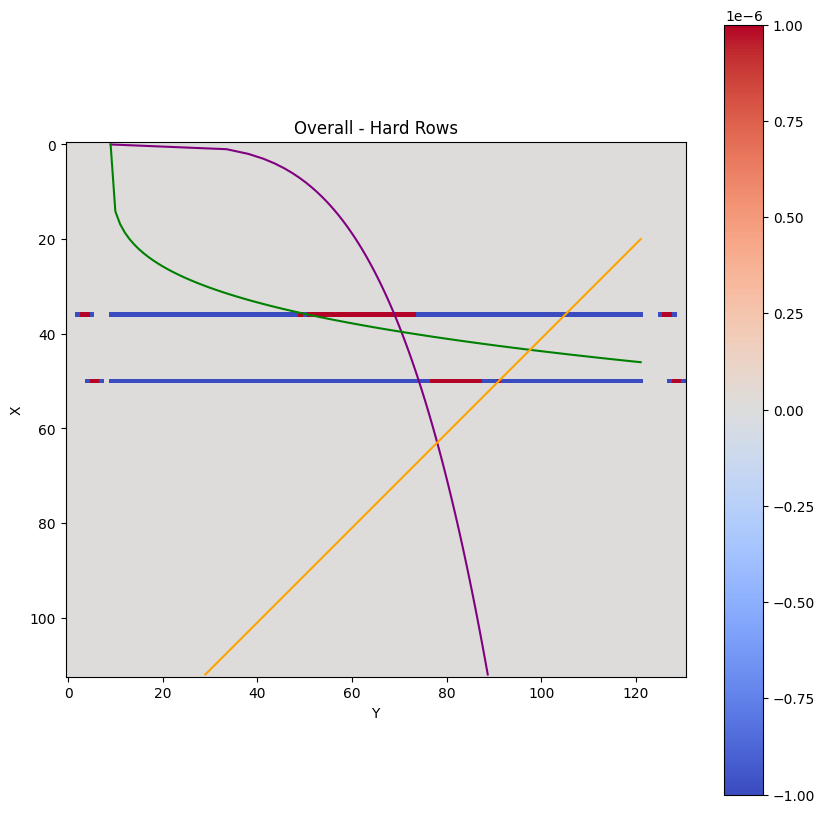

In [33]:

import numpy as np

fig, axs = plt.subplots(2, 2, figsize=(20,20)) # 2 rows, 2 columns
axs = axs.flatten() # Flatten to easily index into axs
overall = np.zeros((113,113))


v = 1

for i, index in enumerate(best_indices):
    to_plot = unembed_original[:,index].reshape(113,113).detach().cpu().numpy()
    formatted_i = "MLP_in Neuron {:04d}".format(index)

    overall += to_plot
    
    if v == 0:
        title = formatted_i
    elif v == 1:
        title = f"Hard Rows {formatted_i}"
    else:
        title = f"Easy Rows {formatted_i}"

    quick_plot_4(axs[i], to_plot, title, V=v)

    axs[0].set_title("MLP_in Neuron 632; red right")
    axs[1].set_title("MLP_in Neuron 78; red all")
    axs[2].set_title("MLP_in Neuron 397; blue left")
    axs[3].set_title("MLP_in Neuron 877; blue right")
    
# Display all plots in the 2x2 grid
plt.tight_layout()
plt.show()

if v == 0:
    title = "Overall"
elif v == 1:
    title = f"Overall - Hard Rows"
else:
    title = f"Overall - Easy Rows"

fig, ax = plt.subplots(figsize=(10,10))
quick_plot_4(ax, overall, title, V=v)
plt.show()
fig, ax = plt.subplots(figsize=(10,10))
quick_plot_4(ax, overall, title, V=v, max_override = .000001)
plt.show()


##############



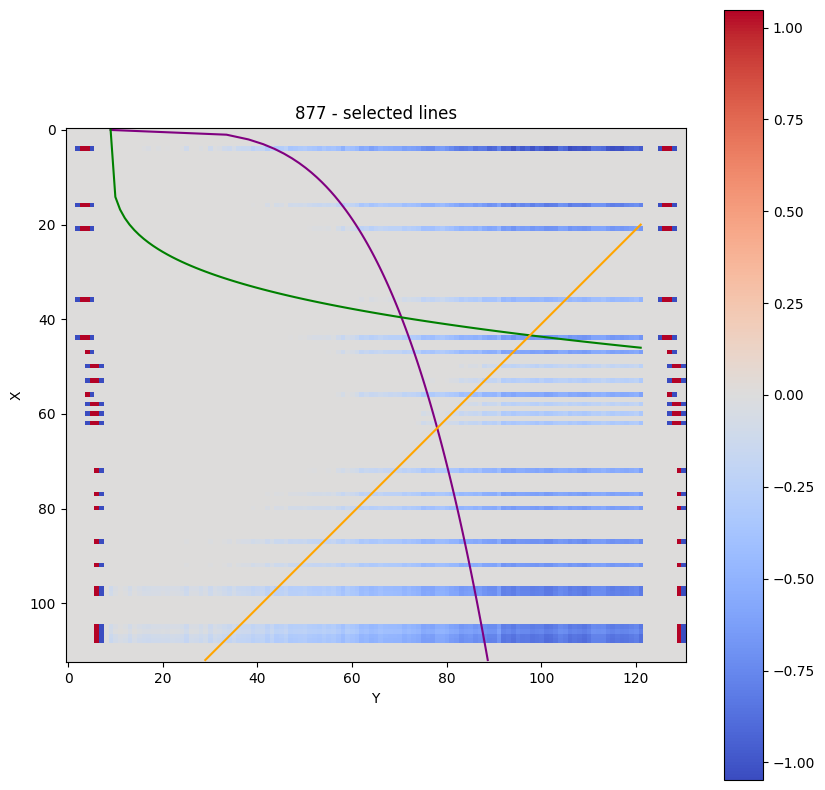

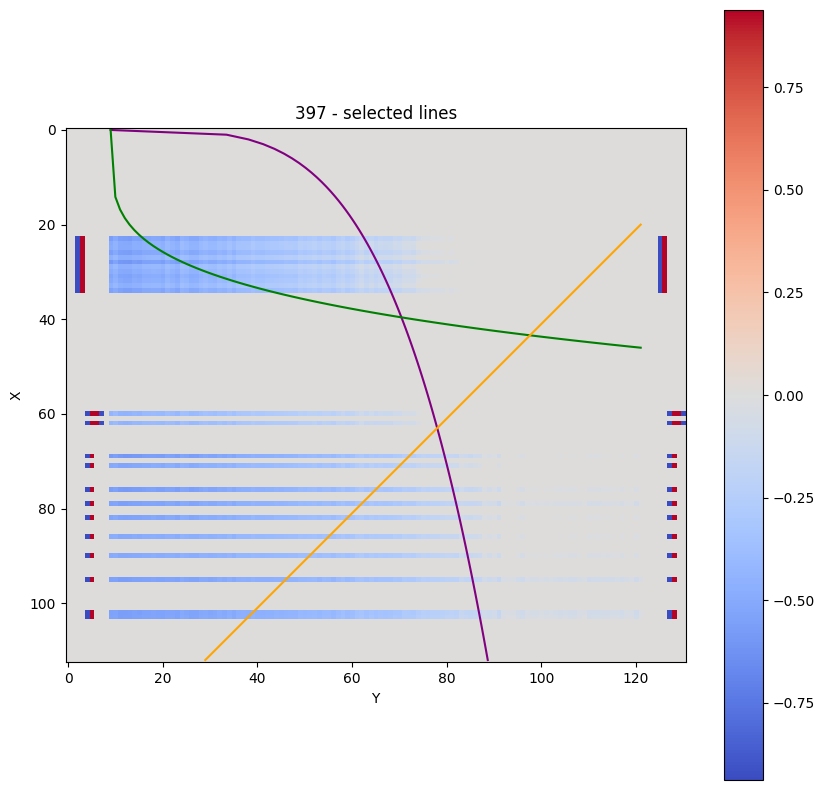

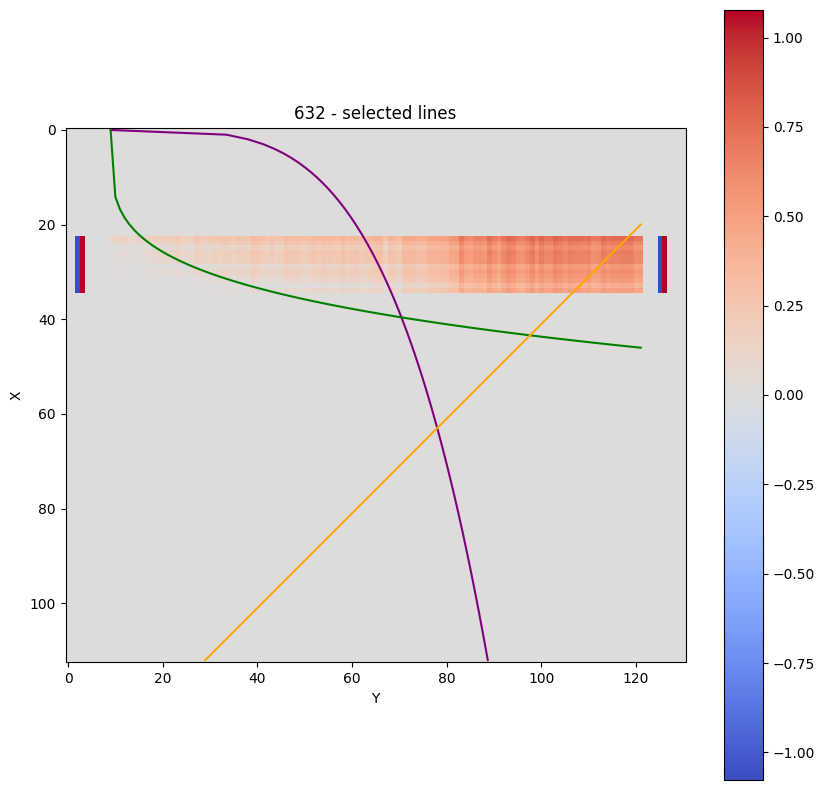

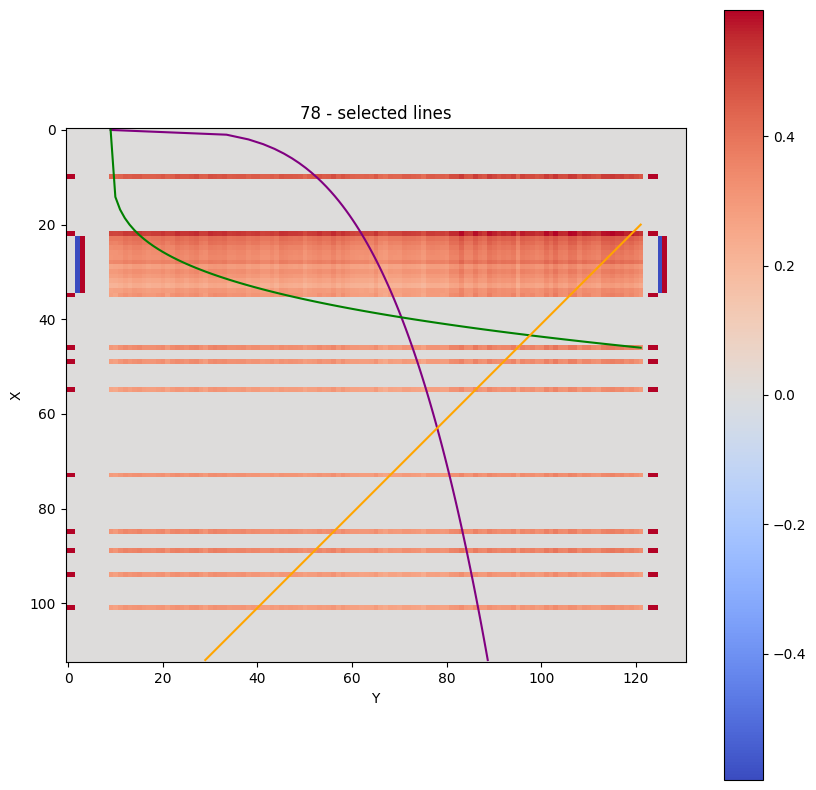

In [81]:
fig, ax = plt.subplots(figsize=(10,10))
to_plot = unembed_original[:,877].reshape(113,113).detach().cpu().numpy()


quick_plot_4(ax, to_plot, "877 - selected lines", V=1, V12keep = get_indices(E2_right,-1) + get_indices(E1_right,-1))

fig, ax = plt.subplots(figsize=(10,10))
to_plot = unembed_original[:,397].reshape(113,113).detach().cpu().numpy()

quick_plot_4(ax, to_plot, "397 - selected lines", V=1, V12keep = \
             get_indices(E0_left,-1, 23, 35) + get_indices(E1_left,-1, minx = 60))

fig, ax = plt.subplots(figsize=(10,10))
to_plot = unembed_original[:,632].reshape(113,113).detach().cpu().numpy()

quick_plot_4(ax, to_plot, "632 - selected lines", V=1, V12keep = \
             get_indices(E0_right, 1,23,35))

fig, ax = plt.subplots(figsize=(10,10))
to_plot = unembed_original[:,78].reshape(113,113).detach().cpu().numpy()

quick_plot_4(ax, to_plot, "78 - selected lines", V=1, V12keep = \
             get_indices(E0_right, 1,23,35)+get_indices(E3_right, 1))



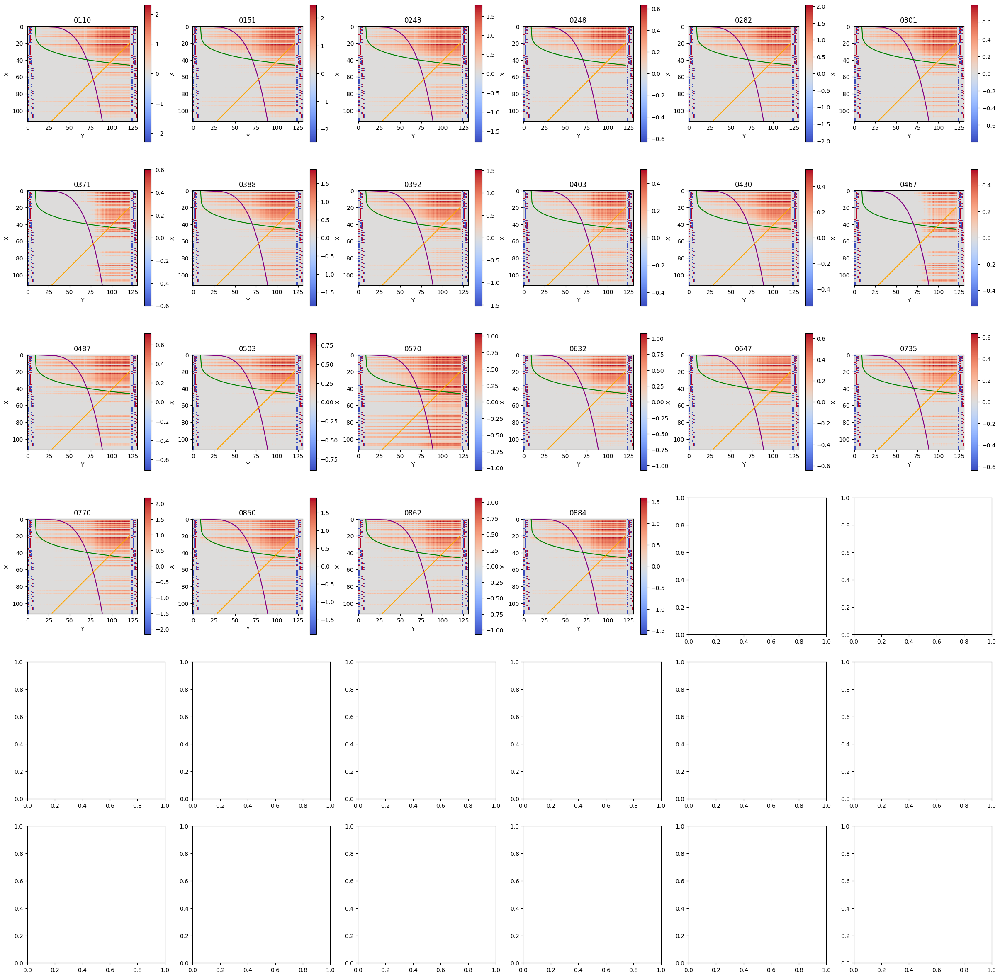

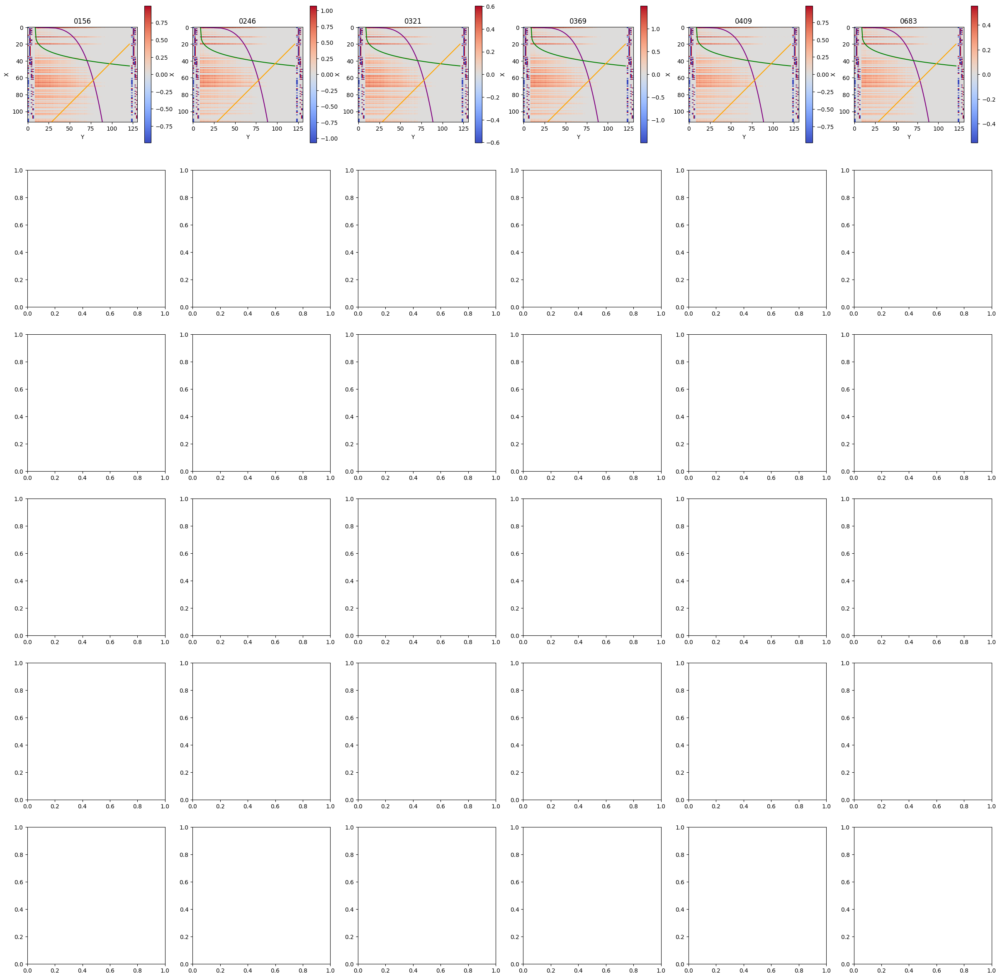

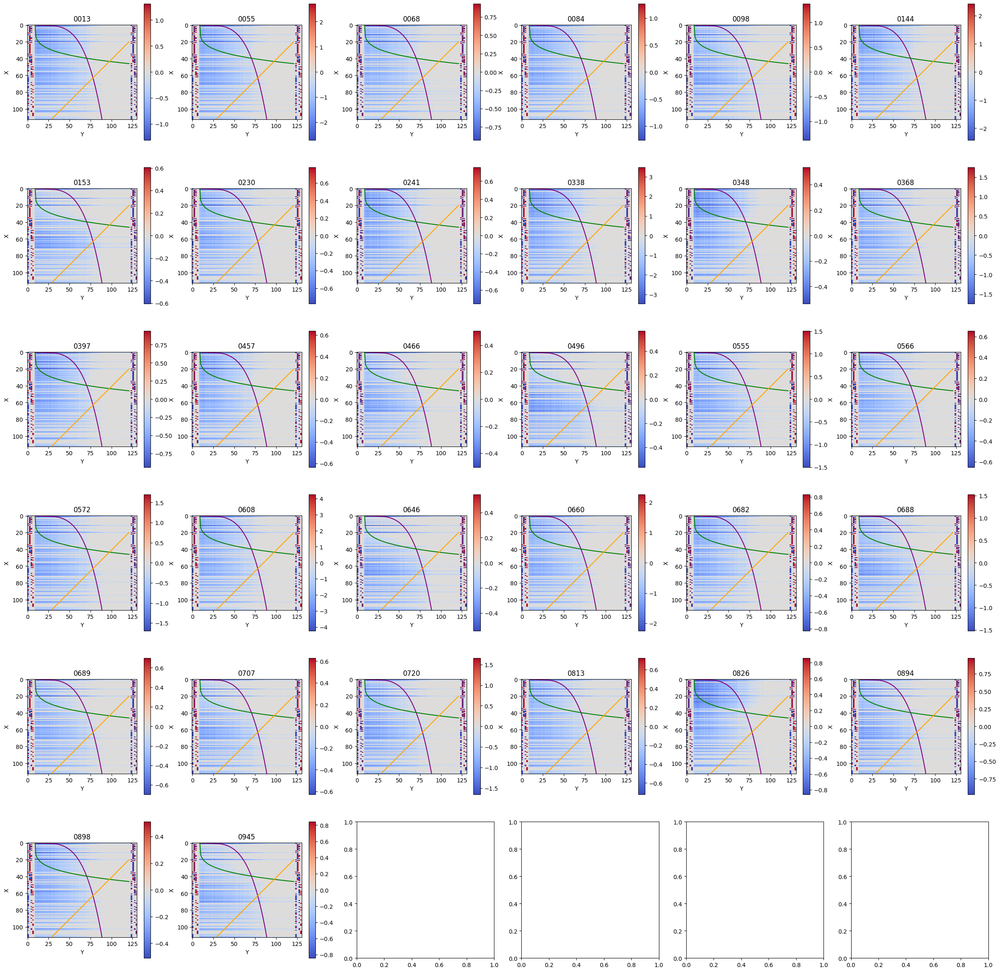

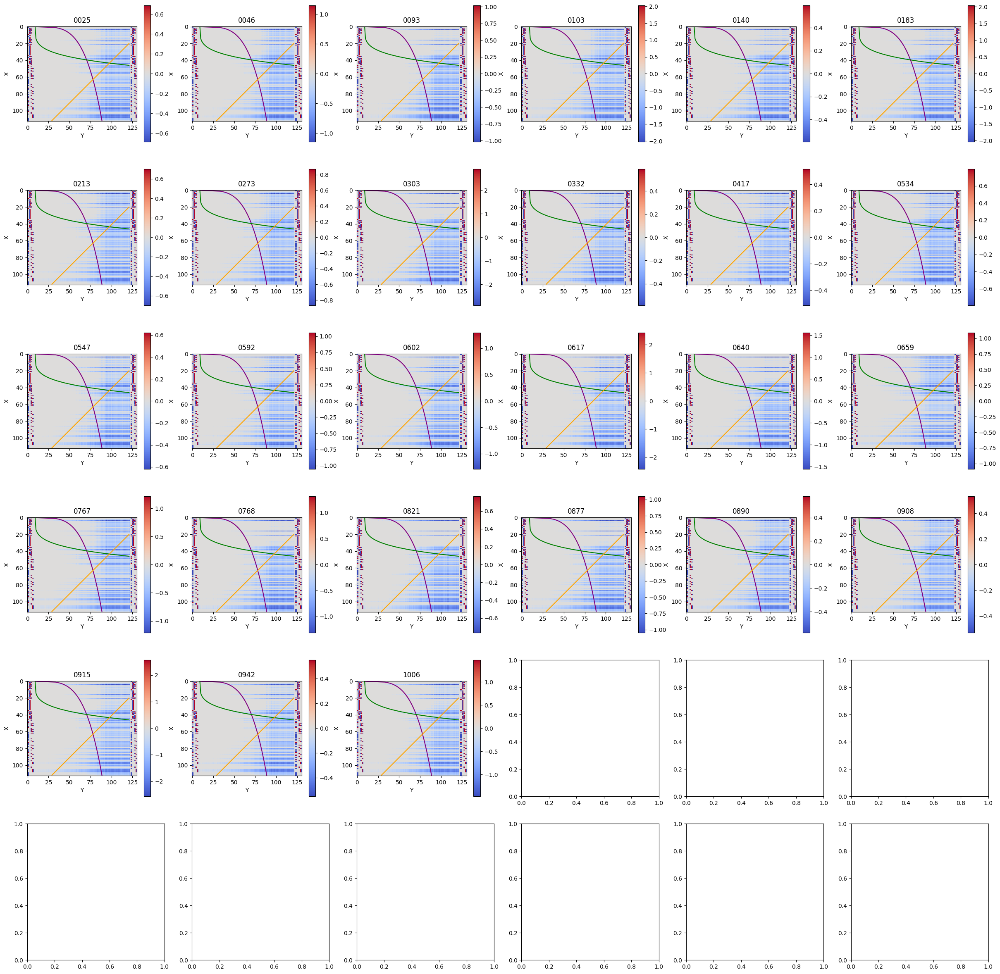

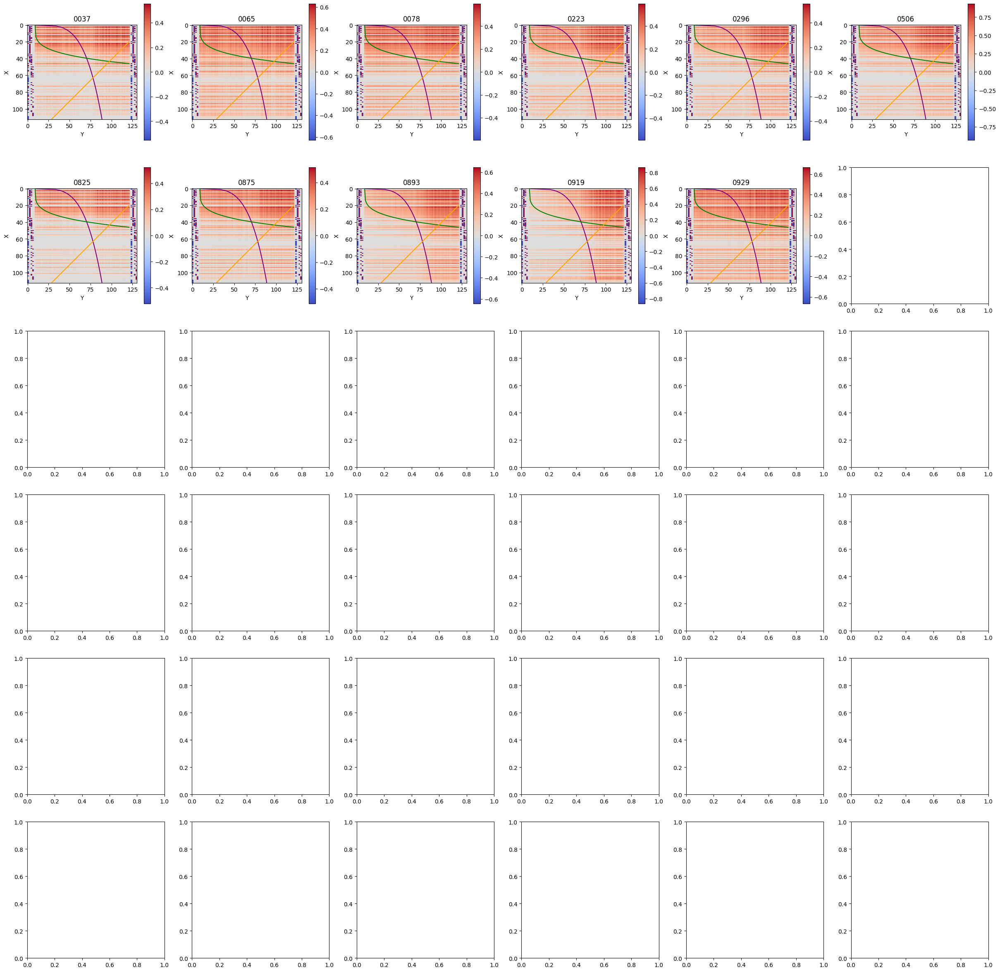

In [35]:
import matplotlib.pyplot as plt
import torch


for rule in [RR,RL,BL,BR,R2]:
    fig, axs = plt.subplots(6, 6, figsize=(30,30)) 
    axs = axs.flatten() # Flatten to easily index into axs
    spot = 0

    for i in rule:
#         print(i)
        to_plot = unembed_original[:,i].reshape(113,113).detach().cpu().numpy()

        formatted_i = "{:04d}".format(i)

        quick_plot_4(axs[spot], to_plot, formatted_i, V=0)
        spot+=1
#         print(spot)
    plt.show()

# 4) Importance.  Count how many errors per row type

[1 0 2 1 2 2 1 2 1 2 0 1 0 1 1 2 2 1 1 2 0 2 0 1 1 1 1 1 1 1 1 1 1 1 1 0 2
 0 2 2 1 1 2 2 2 1 0 1 0 0 2 0 1 2 0 0 1 1 2 1 2 0 2 0 0 0 0 0 0 1 0 1 1 0
 0 0 1 1 0 1 1 0 1 0 0 0 1 1 0 0 1 0 1 0 0 1 0 1 1 0 0 0 1 1 0 1 1 1 1 0 0
 0 0]


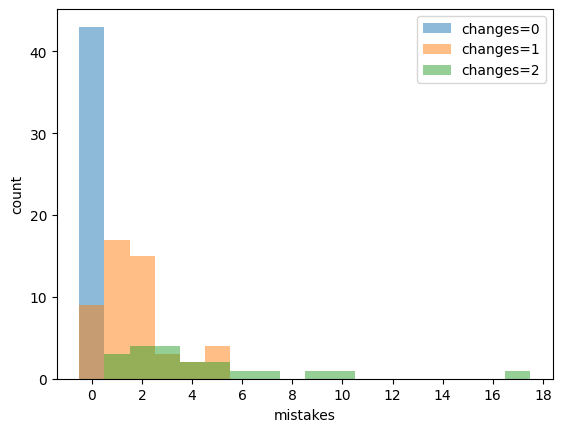

In [36]:
change_counts = np.zeros(labels.shape[0], dtype=int)  # Initialize an array to store the counts

for i in range(labels.shape[0]):
    row = labels[i]
    # Count how many times the value changes in this row
    change_counts[i] = np.sum(row[:-1] != row[1:])

print(change_counts)

dont_match = (1.0*model_prediction).detach().cpu().numpy() !=  labels*1.0
row_mistakes = np.sum(dont_match, axis=1)

# for i in range(113):
#     print (i, change_counts[i], row_mistakes[i] )

import matplotlib.pyplot as plt
import numpy as np

# Filter row_mistakes based on the condition of change_counts
mistakes_when_changes_0 = row_mistakes[change_counts == 0]
mistakes_when_changes_1 = row_mistakes[change_counts == 1]
mistakes_when_changes_2 = row_mistakes[change_counts == 2]

# Set up bins
bins = range(19)

# Plot histogram
plt.hist(mistakes_when_changes_0, bins=bins, alpha=0.5, label='changes=0',align='left')
plt.hist(mistakes_when_changes_1, bins=bins, alpha=0.5, label='changes=1',align='left')
plt.hist(mistakes_when_changes_2, bins=bins, alpha=0.5, label='changes=2',align='left')


plt.xticks(np.arange(0, 20, 2))
plt.xlabel("mistakes")
plt.ylabel("count")

# Legend and show
plt.legend(loc='upper right')
plt.show()

In [37]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import numpy as np

def process_and_train(np_mid, rule, seed=42):
    """
    Process the input data and train a Logistic Regression model on it.
    
    Parameters
    ----------
    np_mid : numpy.ndarray
        The input data assumed to have shape (113, 113, 128).
    rule : bool
        The rule for generating labels.
        If True, labels are generated based on indices,
        else a simple enumeration is used.
        
    Returns
    -------
    float
        The test accuracy of the model.
    """

    # Reshape the data into a 2D array where each row is a sample and each column is a feature
    X = np_mid.reshape(-1, np_mid.shape[-1])

    # Create labels based on rule
    if rule=="X":
        y = np.array([[i] * np_mid.shape[1] for i in range(np_mid.shape[0])]).reshape(-1)
    elif rule=="Y":
        y = np.array([i for i in range(np_mid.shape[1])] * np_mid.shape[0])
    else:
        print ("invalid rule")
        assert(False)
        
    # Split the data into a training set and a test set
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=43)

    # Create an instance of LogisticRegression
    # 'multinomial' option is used when the dependent variable is multiclass
    lr = LogisticRegression(multi_class='multinomial', solver='lbfgs')

    # Fit the model on the training data
    lr.fit(X_train, y_train)

    # Check the accuracy of the model on the test data
    accuracy = lr.score(X_test, y_test)

    return accuracy


In [38]:
# This code is slow, but you can see it making progress.
np_mid = activations['blocks.0.hook_resid_mid'][:,2,:].reshape(113,113,128).detach().cpu().numpy()

Xacc = []
Yacc = []

for seed in range(10):
    Xacc.append(process_and_train(np_mid, "X", seed))
    Yacc.append(process_and_train(np_mid, "Y", seed))
    
print (np.mean(Xacc))
print (np.mean(Yacc))

C:\Users\rick\anaconda3b\envs\conda_env2\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\rick\anaconda3b\envs\conda_env2\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

C:\Users\rick\anaconda3b\envs\conda_env2\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\rick\anaconda3b\envs\conda_env2\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

1.0
0.7819107282693813


C:\Users\rick\anaconda3b\envs\conda_env2\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


# 5) Heads

# pos impact per head

In [39]:
query3 = activations['blocks.0.attn.hook_q'][:,:,2,:]
print(query3.shape)

print ("All data points have same query embedding; note this includes both 113 as well as the positional embedding.")
assert(torch.eq(query3[0], query3[1]).all())

torch.Size([12769, 8, 16])
All data points have same query embedding; note this includes both 113 as well as the positional embedding.


In [40]:
print(model.pos_embed.W_pos.shape)
print(model.blocks[0].attn.W_Q.shape)

# Get key for each position.
key_pos = torch.einsum("ab,cdb->cad",model.pos_embed.W_pos,model.blocks[0].attn.W_K)
print(key_pos.shape)

# Get positional contribution for each attn logit.
overall_pos = torch.einsum("hd,hsd->hs",query3[0],key_pos)
print(overall_pos.shape)

head_deltas = overall_pos.detach().cpu().numpy()[:,1]-overall_pos.detach().cpu().numpy()[:,0]
np.set_printoptions(precision=3, suppress=True)
#print(overall_pos.detach().cpu().numpy())
for i in range(8):
    print (i, head_deltas[i])
print ("Unlike other attn heads, attn head 2 pays more attn to the second term (vs the first term)")
print ("Also note heads 0, 1, 5 are quite negative (and similar to each other)")

torch.Size([3, 128])
torch.Size([8, 16, 128])
torch.Size([8, 3, 16])
torch.Size([8, 3])
0 -11.039421
1 -11.861618
2 4.234958
3 -2.9315739
4 -3.7969134
5 -11.75295
6 -2.0377593
7 -6.1885424
Unlike other attn heads, attn head 2 pays more attn to the second term (vs the first term)
Also note heads 0, 1, 5 are quite negative (and similar to each other)


# plots of attn impact per number

In [41]:
print(model.embed.W_E.shape)
print(model.blocks[0].attn.W_K.shape)
# e = embedding dimension
# i = integers
# h = heads
# d = model dimension
K_for_integers = torch.einsum("ei,hde->ihd", model.embed.W_E,model.blocks[0].attn.W_K)

print(K_for_integers.shape)
print(query3[0].shape)

torch.Size([128, 114])
torch.Size([8, 16, 128])
torch.Size([114, 8, 16])
torch.Size([8, 16])


In [42]:
QK_for_integers = torch.einsum("hd,bhd->bh", query3[0], K_for_integers)


### 3.0.3) Test

In [43]:
print(QK_for_integers.shape)
# print(overall_pos.shape)

expected_0_at_0 = QK_for_integers[0] + overall_pos[:,0]
expected_0_at_1 = QK_for_integers[0] + overall_pos[:,1]
expected_10_at_1 = QK_for_integers[10] + overall_pos[:,1]
expected_42_at_1 = QK_for_integers[42] + overall_pos[:,1]

# print(expected_0_at_0)
# print(expected_10_at_1)

torch.Size([114, 8])


In [44]:
# p = p^2 datapoints
# h = heads
# i,j = input and output dims for attn
# d = model dimension

print(activations['blocks.0.attn.hook_k'].shape)
print(activations['blocks.0.attn.hook_q'].shape)
qk_activations_model = torch.einsum("phid,phjd->phij",activations['blocks.0.attn.hook_q'],activations['blocks.0.attn.hook_k'])

print(qk_activations_model.shape)
actual_qk = qk_activations_model[:,:,2,:]



torch.Size([12769, 8, 3, 16])
torch.Size([12769, 8, 3, 16])
torch.Size([12769, 8, 3, 3])


In [45]:
actual_0_at_0 = actual_qk[0,:,0]  # 0,0
actual_0_at_0_again = actual_qk[42,:,0]  #0, 42
actual_0_at_1 = actual_qk[0,:,1]  #0, 0
actual_10_at_1 = actual_qk[10,:,1] #10, 0
actual_42_at_1 = actual_qk[42+p*57,:,1] #57, 42

assert(torch.allclose(expected_0_at_0, actual_0_at_0,.001))
assert(torch.allclose(expected_0_at_0, actual_0_at_0_again,.001))
assert(torch.allclose(expected_0_at_1, actual_0_at_1,.001))
assert(torch.allclose(expected_10_at_1, actual_10_at_1,.001))
assert(torch.allclose(expected_42_at_1, actual_42_at_1,.001))

In [46]:
del qk_activations_model,actual_qk

In [47]:
QK_for_integers_np = QK_for_integers.detach().cpu().numpy()

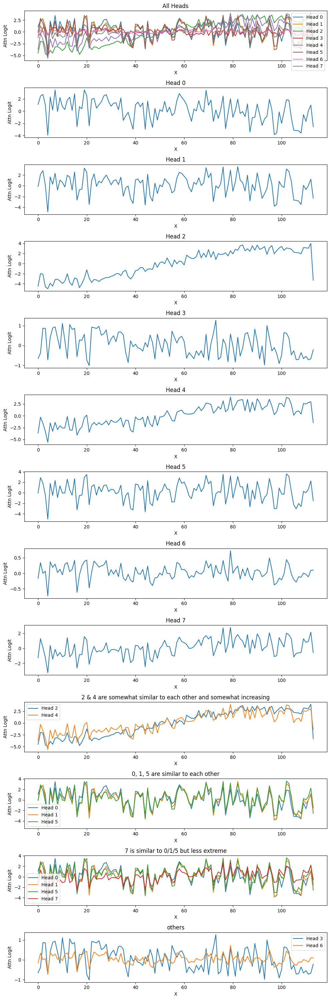

In [48]:
fig, axs = plt.subplots(13, 1, figsize=(10,30))

# Plot all curves on the first subplot
for i in range(QK_for_integers_np.shape[1]):
    axs[0].plot(QK_for_integers_np[:, i], label=f'Head {i}')
axs[0].set_title('All Heads')
axs[0].legend()


# Plot each curve on an individual subplot
for i in range(QK_for_integers_np.shape[1]):
    axs[i + 1].plot(QK_for_integers_np[:, i])
    axs[i + 1].set_title(f'Head {i}')


for i in [2,4]:
    axs[9].plot(QK_for_integers_np[:, i], label=f'Head {i}')
axs[9].set_title('2 & 4 are somewhat similar to each other and somewhat increasing')
axs[9].legend()


for i in [0,1,5]:
    axs[10].plot(QK_for_integers_np[:, i], label=f'Head {i}')
axs[10].set_title('0, 1, 5 are similar to each other')
axs[10].legend()

# Plot all curves on the first subplot
for i in [0,1,5, 7]:
    axs[11].plot(QK_for_integers_np[:, i], label=f'Head {i}')
axs[11].set_title('7 is similar to 0/1/5 but less extreme')
axs[11].legend()
    
for i in [3,6]:
    axs[12].plot(QK_for_integers_np[:, i], label=f'Head {i}')
axs[12].set_title('others')
axs[12].legend()

# for i in range(13):
#     add_color_bars(axs[i])
    
for i in range(13):
    axs[i].set_xlabel("X")    
    axs[i].set_ylabel("Attn Logit")
plt.tight_layout()
plt.show()

## 5.2) Function to calc network given a passed attn. Overkill! (I was initially planning something else that didn't pan out, but this function still works).

In [49]:
def calc_output_from_ablated_attn(possibly_ablated_attn, test=False):
    # Starting resid stream for x_2 begins as permanent_resid_pre
    resid_pre = activations['blocks.0.hook_resid_pre'][:,2,:]
#     print(resid_pre.shape)
    permanent_resid_pre = resid_pre[0][:]
    # print(permanent_resid_pre.shape)

    # calc Z from V and attn
    z = torch.einsum('biph,bi p->bih', activations['blocks.0.attn.hook_v'], possibly_ablated_attn)
    if test:
        print(z.shape)
        z_expected = activations['blocks.0.attn.hook_z'][:,:,2,:]
        print(z_expected.shape)
        assert(torch.allclose(z[3,4,9], z_expected[3,4,9],.001))
        assert(torch.allclose(z[333,5,5], z_expected[333,5,5],.001))
        assert(torch.allclose(z[555,6,6], z_expected[555,6,6],.001))

    # Calc O output from Z
    # batch, head index,  input dim; out dim, head index, input dim
    o_output = torch.einsum('bhd,ohd->bho', z, model.blocks[0].attn.W_O.view(128, 8, 16))
    # batch, head index, out dim
    o_test = torch.einsum('bho -> bo', o_output)
    if test:
        print(o_output.shape)
        o_expected = activations['blocks.0.hook_attn_out'][:,2,:]
        print(o_expected.shape)
        print (o_test.shape)
        assert(torch.allclose(o_test[5,41], o_expected[5,41],.001))
        assert(torch.allclose(o_test[393,51], o_expected[393,51],.001))
        assert(torch.allclose(o_test[565,61], o_expected[565,61],.001))

    # check resid stream
    # At this point, resid stream is permanent_resid_pre + o_output but note that these 
    # tensors aren't same size since I am keeping attn heads separate in o_output  
    resid_mid_test = o_test+resid_pre   
    if test:
        resid_mid_expected = activations['blocks.0.hook_resid_mid'][:,2,:]
        print(resid_mid_expected.shape)
        assert(torch.allclose(resid_mid_test[55,1], resid_mid_expected[55,1],.001))
        assert(torch.allclose(resid_mid_test[555,111], resid_mid_expected[555,111],.001))
        assert(torch.allclose(resid_mid_test[5555,11], resid_mid_expected[5555,11],.001))

    # MLP in pre
    # print(model.blocks[0].mlp.W_in.shape)
    # print(model.blocks[0].mlp.b_in.shape)
    # # batch, head index, spot (which of 3), out dim
    # print(o_output.shape)
    # print(resid_pre.shape)
    mlp_in_pre_from_o = torch.einsum('bhi,oi->bho', o_output, model.blocks[0].mlp.W_in)
    # print(mlp_in_pre_from_o.shape)
    mlp_in_pre_from_resid_pre = torch.einsum('i,oi->o', permanent_resid_pre, model.blocks[0].mlp.W_in)
    # print(mlp_in_pre_from_resid_pre.shape)
    mlp_in_pre_bias = model.blocks[0].mlp.b_in
    # print(mlp_in_pre_bias.shape)
    # This term will be used later for activitations.
    mlp_in_pre_combined = torch.einsum('bho -> bo', mlp_in_pre_from_o) + mlp_in_pre_from_resid_pre + mlp_in_pre_bias
    if test:
        mlp_pre_expected = activations['blocks.0.mlp.hook_pre'][:,2,:]
        # Rollup the complicated MLP term
        mlp_in_pre_test = mlp_in_pre_combined
        print(mlp_in_pre_test.shape)
        assert(torch.allclose(mlp_in_pre_test[1,2], mlp_pre_expected[1,2],.001))
        assert(torch.allclose(mlp_in_pre_test[11,13], mlp_pre_expected[11,13],.001))
        assert(torch.allclose(mlp_in_pre_test[15,16], mlp_pre_expected[15,16],.001))

    mlp_in_post_combined = F.relu(mlp_in_pre_combined)
    active = mlp_in_post_combined > 0 
    mlp_in_post_from_o = torch.einsum('bho,bo->bho', mlp_in_pre_from_o, active)
    mlp_in_post_from_resid_pre = torch.einsum('o,bo->bo', mlp_in_pre_from_resid_pre, active)
    mlp_in_post_bias = torch.einsum('o,bo->bo', mlp_in_pre_bias, active)

    if test:
        mlp_in_post_expected = activations['blocks.0.mlp.hook_post'][:,2,:]
        # Rollup the complicated MLP term
        mlp_in_post_test = torch.einsum('bho -> bo', mlp_in_post_from_o) + mlp_in_post_from_resid_pre + mlp_in_post_bias
        print(mlp_in_post_test.shape)
        assert(torch.allclose(mlp_in_post_test[1,2], mlp_in_post_expected[1,2],.001))
        assert(torch.allclose(mlp_in_post_test[11,13], mlp_in_post_expected[11,13],.001))
        assert(torch.allclose(mlp_in_post_test[15,16], mlp_in_post_expected[15,16],.001))

    # print(mlp_in_post_from_o.shape)
    # print(mlp_in_post_from_resid_pre.shape)
    # print(mlp_in_post_bias.shape)
    # print(model.blocks[0].mlp.W_out.shape)
    # print(model.blocks[0].mlp.b_out.shape)

    mlp_out_attn = torch.einsum('bhi,oi->bho', mlp_in_post_from_o, model.blocks[0].mlp.W_out)
    mlp_out_resid = torch.einsum('bi,oi->bo', mlp_in_post_from_resid_pre, model.blocks[0].mlp.W_out)
    mlp_out_bias_in = torch.einsum('bi,oi->bo', mlp_in_post_bias, model.blocks[0].mlp.W_out)
    mlp_out_bias_out = model.blocks[0].mlp.b_out
    if test:
        mlp_out_expected = activations['blocks.0.hook_mlp_out'][:,2,:]
        print(mlp_out_attn.shape)
        print(mlp_out_resid.shape)
        print(mlp_out_bias_in.shape)
        print(mlp_out_bias_out.shape)
        mlp_out_test = torch.einsum('bho -> bo', mlp_out_attn) + mlp_out_resid + mlp_out_bias_in + mlp_out_bias_out
        assert(torch.allclose(mlp_in_post_test[11,2], mlp_in_post_expected[11,2],.001))
        assert(torch.allclose(mlp_in_post_test[111,13], mlp_in_post_expected[111,13],.001))
        assert(torch.allclose(mlp_in_post_test[115,16], mlp_in_post_expected[115,16],.001))

    # resid stream has 6 tensors:
    # resid_pre, o_output, mlp_out_attn, mlp_out_resid, mlp_out_bias_in, mlp_out_bias_out
#     print(resid_pre.shape)
#     print(o_output.shape)
#     print(mlp_out_attn.shape)
#     print(mlp_out_resid.shape)
#     print(mlp_out_bias_in.shape)
#     print(mlp_out_bias_out.shape)

    unembed_favoring_1 = model.unembed.W_U[:,1]-model.unembed.W_U[:,0]
#     print(unembed_favoring_1.shape)

    # b = batch, d = dimension (128), h = head (8)
    resid_pre_unembed = torch.einsum('bd,d->b', resid_pre, unembed_favoring_1)
    o_output_unembed = torch.einsum('bhd,d->bh', o_output, unembed_favoring_1)
    mlp_out_attn_unembed = torch.einsum('bhd,d->bh', mlp_out_attn, unembed_favoring_1)
    mlp_out_resid_unembed = torch.einsum('bd,d->b', mlp_out_resid, unembed_favoring_1)
    mlp_out_bias_in_unembed = torch.einsum('bd,d->b', mlp_out_bias_in, unembed_favoring_1)
    mlp_out_bias_out_unembed = torch.einsum('d,d->', mlp_out_bias_out, unembed_favoring_1)

    one_favor = torch.einsum('bh -> b', o_output_unembed) + torch.einsum('bh -> b', mlp_out_attn_unembed) + \
                     resid_pre_unembed + mlp_out_resid_unembed + mlp_out_bias_in_unembed + mlp_out_bias_out_unembed

    if test:
        print(resid_pre.shape)
        print(o_output.shape)
        print(mlp_out_attn.shape)
        print(mlp_out_resid.shape)
        print(mlp_out_bias_in.shape)
        print(mlp_out_bias_out.shape)
        print(resid_pre_unembed.shape)
        print(o_output_unembed.shape)
        print(mlp_out_attn_unembed.shape)
        print(mlp_out_resid_unembed.shape)
        print(mlp_out_bias_in_unembed.shape)
        print(mlp_out_bias_out_unembed.shape)
        one_favor_expected = output[:,2,1] - output[:,2,0] 
        one_favor_test = one_favor
        print(one_favor_expected.shape)
        print(one_favor_test.shape)
        assert(torch.allclose(one_favor_test[42],   one_favor_expected[42],.001))
        assert(torch.allclose(one_favor_test[424],  one_favor_expected[424],.001))
        assert(torch.allclose(one_favor_test[4242], one_favor_expected[4242],.001))

    ablated_model_predictions = one_favor > 0
    return ablated_model_predictions, mlp_in_post_combined, resid_mid_test, one_favor, mlp_out_attn_unembed


## Explore partially ablating attn

In [51]:
attn_v3 = activations['blocks.0.attn.hook_attn'][:,:,2,:]
average_attn = attn_v3.mean(dim=0)
print(average_attn.shape)

torch.Size([8, 3])


In [52]:
# check code still works with normal attn:
calc_output_from_ablated_attn(attn_v3, test=True)

# And it fails with modified attn.
modified_attn = average_attn.repeat(113*113, 1, 1)
try:
    calc_output_from_ablated_attn(modified_attn, test=True)
    # Should not be triggered
    assert(False)
except AssertionError as e:
    print(f"Caught an AssertionError as expected.")

torch.Size([12769, 8, 16])
torch.Size([12769, 8, 16])
torch.Size([12769, 8, 128])
torch.Size([12769, 128])
torch.Size([12769, 128])
torch.Size([12769, 128])
torch.Size([12769, 1024])
torch.Size([12769, 1024])
torch.Size([12769, 8, 128])
torch.Size([12769, 128])
torch.Size([12769, 128])
torch.Size([128])
torch.Size([12769, 128])
torch.Size([12769, 8, 128])
torch.Size([12769, 8, 128])
torch.Size([12769, 128])
torch.Size([12769, 128])
torch.Size([128])
torch.Size([12769])
torch.Size([12769, 8])
torch.Size([12769, 8])
torch.Size([12769])
torch.Size([12769])
torch.Size([])
torch.Size([12769])
torch.Size([12769])
torch.Size([12769, 8, 16])
torch.Size([12769, 8, 16])
Caught an AssertionError as expected.


In [53]:
def get_ablation_similarity(old,new):
    return (1.0*sum(old == new)/113.0/113.0).item()

In [54]:
attn_v3 = activations['blocks.0.attn.hook_attn'][:,:,2,:]
average_attn = attn_v3.mean(dim=0)
modified_attn = average_attn.repeat(113*113, 1, 1)

original_output, original_mlp_post, original_resid_mid, original_raw, original_mlp_out_attn_unembed = calc_output_from_ablated_attn(attn_v3)
ablated_output, ablated_mlp_post, ablated_resid_mid_all, ablated_rawNone, _ = calc_output_from_ablated_attn(modified_attn)
sim = get_ablation_similarity(original_output,ablated_output)
print(sim)

# matches result from original solution
assert (sim >= .9285)
assert (sim <= .9295)

0.9286553263664246


In [55]:
mlp_in_post_combineds = []
for i in range(8):
    # Ablate all but i
    modified_attn = average_attn.repeat(113*113, 1, 1)
    modified_attn[:,i,:] = attn_v3[:,i,:]
    ablated_output, mlp_in_post_combined, ablated_resid_mid, ablated_raw, _ = calc_output_from_ablated_attn(modified_attn)
    mlp_in_post_combineds.append(mlp_in_post_combined)
    sim = get_ablation_similarity(original_output,ablated_output)
    print (i, sim)

0 0.929673433303833
1 0.930378258228302
2 0.9714934825897217
3 0.9293601512908936
4 0.9539510011672974
5 0.929673433303833
6 0.9288119673728943
7 0.9326493740081787


In [56]:
# Ablate all but 2 + 4
modified_attn = average_attn.repeat(113*113, 1, 1)
modified_attn[:,2,:] = attn_v3[:,2,:]
modified_attn[:,4,:] = attn_v3[:,4,:]
ablated_output8, mlp_in_post_combined, ablated_resid_mid8, ablated_raw8, _ = calc_output_from_ablated_attn(modified_attn)
mlp_in_post_combineds.append(mlp_in_post_combined)
sim = get_ablation_similarity(original_output,ablated_output8)
print (sim)

0.9891926050186157


# 6) More head stuff

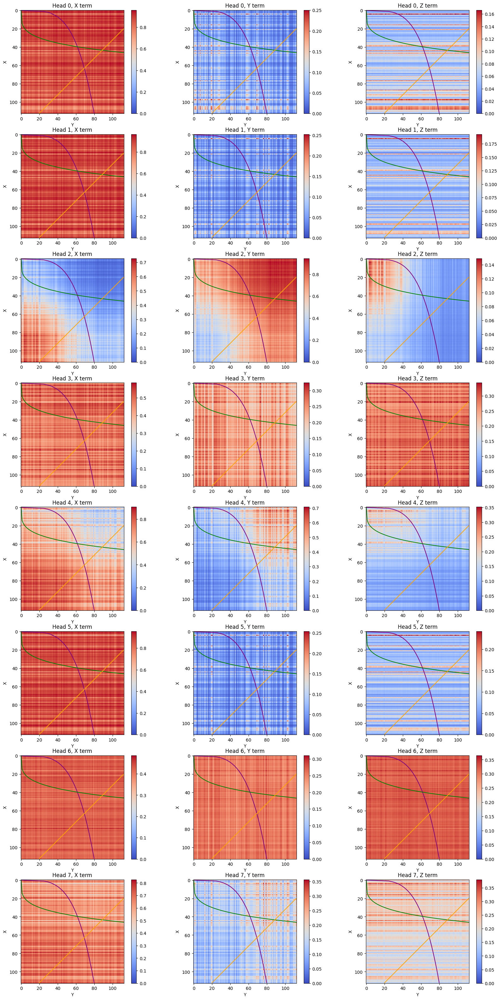

In [57]:
fig, axs = plt.subplots(8, 3, figsize=(20,40))
for i in range(8):
    quick_plot_4(axs[i,0],activations['blocks.0.attn.hook_attn'][:,i,2,0].reshape(113,113).detach().cpu().numpy(),f'Head {i}, X term',vmin_to_0=True)
    quick_plot_4(axs[i,1],activations['blocks.0.attn.hook_attn'][:,i,2,1].reshape(113,113).detach().cpu().numpy(),f'Head {i}, Y term',vmin_to_0=True)
    quick_plot_4(axs[i,2],activations['blocks.0.attn.hook_attn'][:,i,2,2].reshape(113,113).detach().cpu().numpy(),f'Head {i}, Z term',vmin_to_0=True)

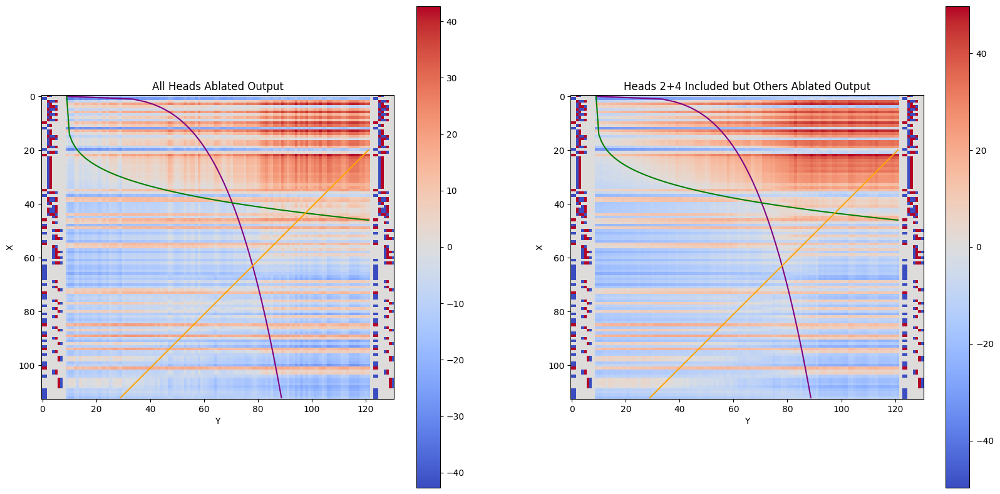

In [58]:
fig, axs = plt.subplots(1, 2, figsize=(20,10)) 
quick_plot_4(axs[0],ablated_rawNone.reshape(113,113).detach().cpu().numpy(),f'All Heads Ablated Output')
quick_plot_4(axs[1],ablated_raw8.reshape(113,113).detach().cpu().numpy(),f'Heads 2+4 Included but Others Ablated Output')


# 7) Extended embeddings

## 7.0) Extended Embedding, includes MLP_in

In [59]:
# print(model.blocks[0].attn.W_V.shape)
# print(model.embed.W_E.shape)

EV = torch.einsum("db,hzd->bhz",model.embed.W_E,model.blocks[0].attn.W_V)
# print(EV.shape)
# print(model.blocks[0].attn.W_O.shape)

# Tricky - double check
EVO = torch.einsum("bhi,ohi->bho",EV,model.blocks[0].attn.W_O.view(128,8,16))

# print(EVO.shape)
# print(model.blocks[0].mlp.W_in.shape)

EVOMlp_in = torch.einsum("bhi,oi->bho",EVO,model.blocks[0].mlp.W_in)
print(EVOMlp_in.shape)

torch.Size([114, 8, 1024])


In [73]:
# p = embeddings for 114 numbers
# h = head
# n = MLP neuron index
# s = spots (3) 
VOMs_weighted_all = torch.einsum("phn,hs->pns",EVOMlp_in,average_attn)
# VOMs_weighted_all_rollup = torch.einsum("phn,hs->pn",EVOMlp_in,average_attn)
print(VOMs_weighted_all.shape)

torch.Size([114, 1024, 3])


## 8.1) Weight by attn. / Extended Embedding directions.

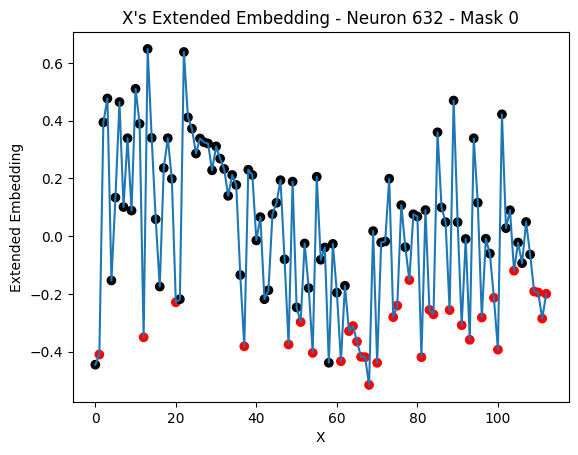

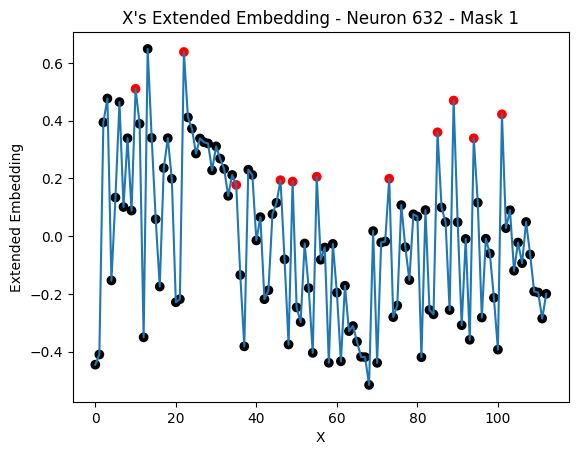

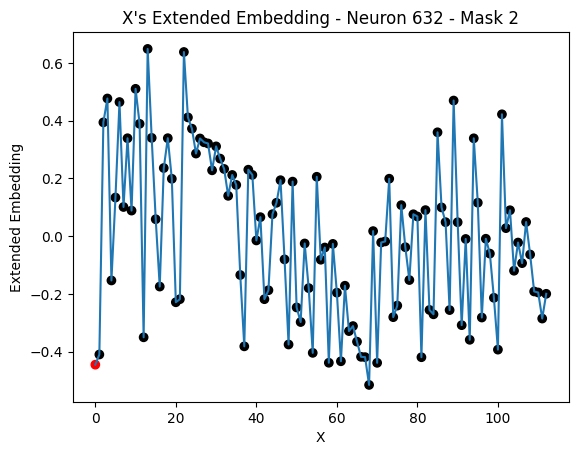

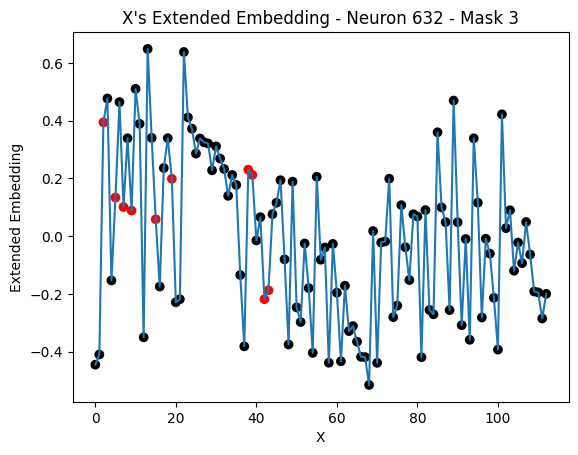

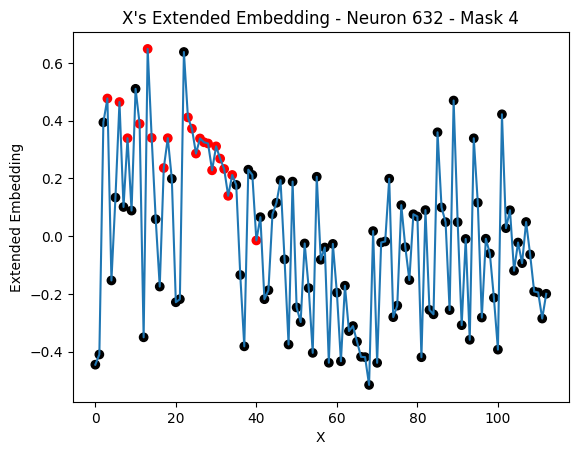

...

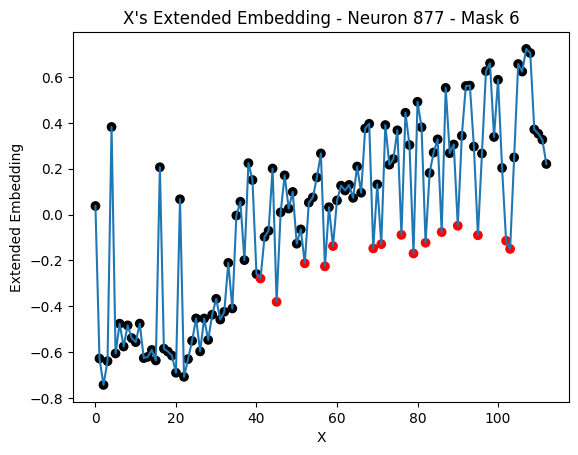

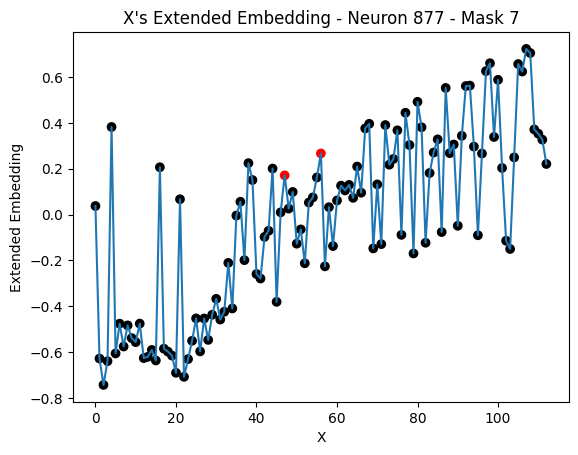

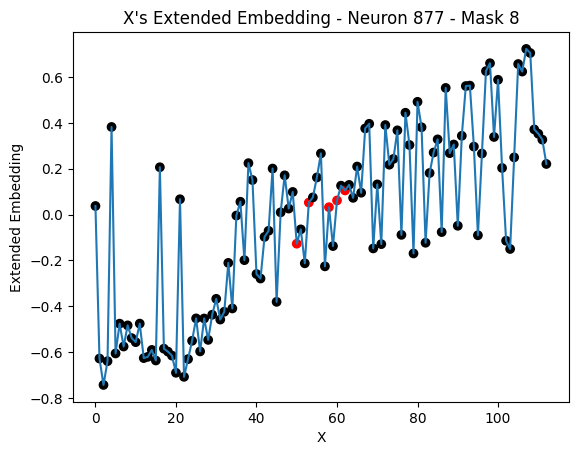

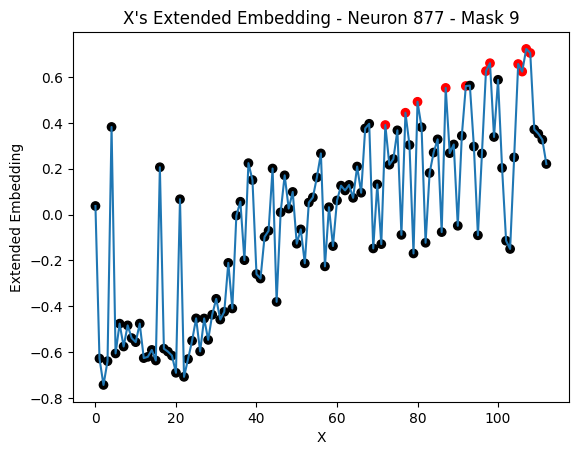

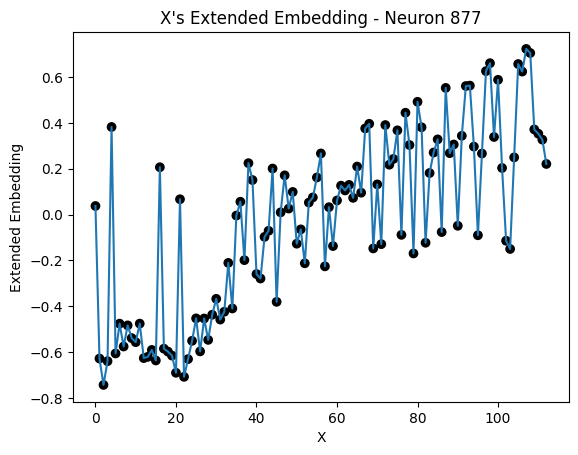

In [76]:
import matplotlib.pyplot as plt
import numpy as np

colors = np.array(['black', 'red'])

VOMs_weighted_all_np = VOMs_weighted_all.detach().cpu().numpy()
# VOMs_weighted_all_rollup_np = VOMs_weighted_all_rollup.detach().cpu().numpy()

figs, axs = [], []

for i in best_indices:
    # iterate thru each mask
    for j in range(10):
        # Create a new figure and axes for each plot
        fig, ax = plt.subplots()
        figs.append(fig)
        axs.append(ax)

        ax.scatter(list(range(113)),VOMs_weighted_all_np[:-1, i, 0],c=colors[rules_3.astype(int)[j]])
        ax.plot(VOMs_weighted_all_np[:-1, i, 0])


        ax.set_title(f"X's Extended Embedding - Neuron {i} - Mask {j}")

        ax.set_xlabel('X')
        ax.set_ylabel("Extended Embedding")

        plt.show()
    # Create a new figure and axes for each plot
    fig, ax = plt.subplots()
    figs.append(fig)
    axs.append(ax)

    ax.scatter(list(range(113)),VOMs_weighted_all_np[:-1, i, 0],c=np.array(['black', 'black'])[rules_3.astype(int)[j]])
    ax.plot(VOMs_weighted_all_np[:-1, i, 0])


    ax.set_title(f"X's Extended Embedding - Neuron {i}")

    ax.set_xlabel('X')
    ax.set_ylabel("Extended Embedding")

    plt.show()

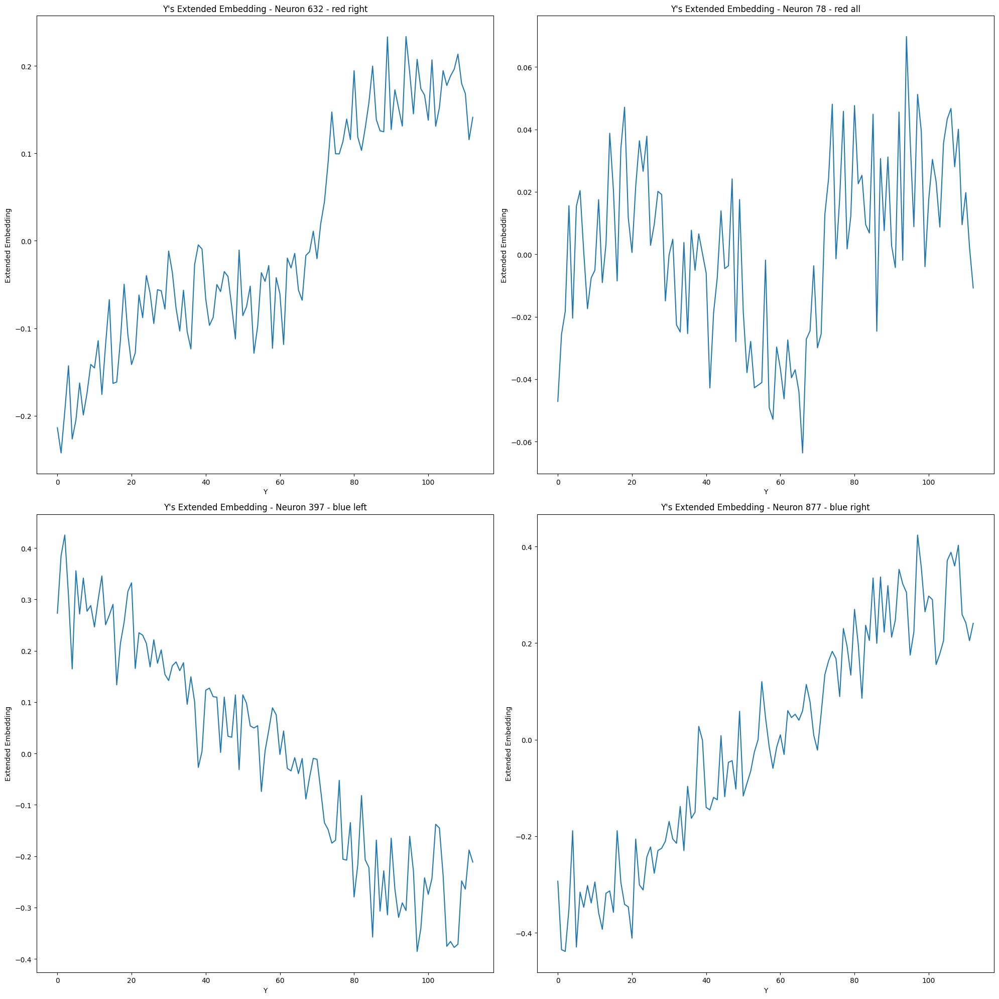

In [82]:
import numpy as np

fig, axs = plt.subplots(2, 2, figsize=(20,20)) # 2 rows, 2 columns
axs = axs.flatten() # Flatten to easily index into axs



for i, index in enumerate(best_indices):
    axs[i].plot(VOMs_weighted_all_np[:-1, index, 1])
    axs[i].set_xlabel("Y")
    axs[i].set_ylabel("Extended Embedding")

axs[0].set_title(f"Y's Extended Embedding - Neuron 632 - red right")
axs[1].set_title(f"Y's Extended Embedding - Neuron 78 - red all")
axs[2].set_title(f"Y's Extended Embedding - Neuron 397 - blue left")
axs[3].set_title(f"Y's Extended Embedding - Neuron 877 - blue right")




# Display all plots in the 2x2 grid
plt.tight_layout()
plt.show()

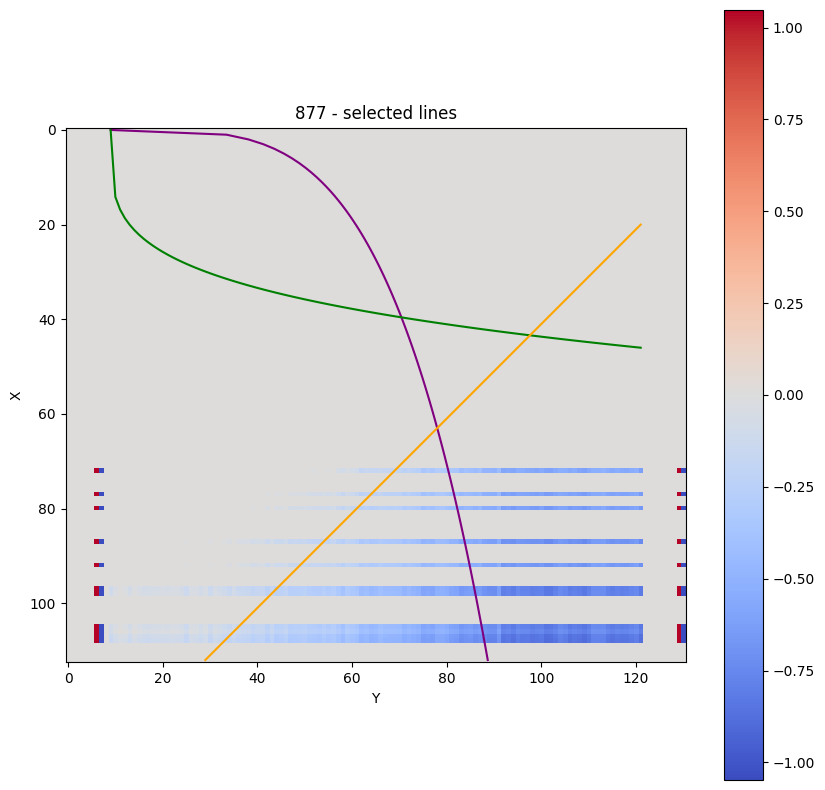

In [63]:
fig, ax = plt.subplots(figsize=(10,10))
to_plot = unembed_original[:,877].reshape(113,113).detach().cpu().numpy()


quick_plot_4(ax, to_plot, "877 - selected lines", V=1, V12keep = get_indices(E2_right,-1)[5:])


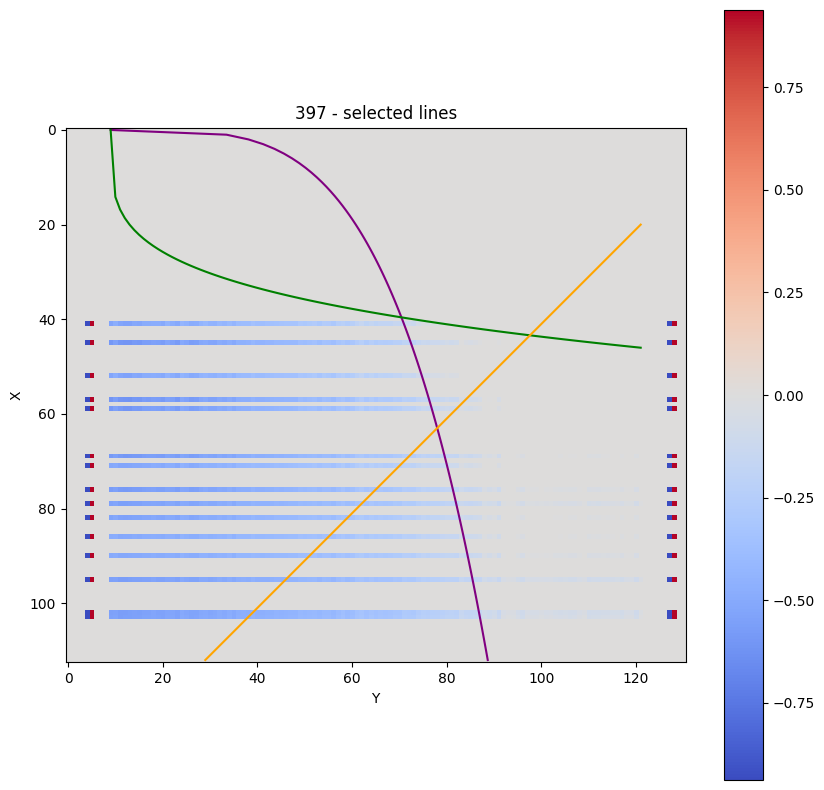

In [64]:
fig, ax = plt.subplots(figsize=(10,10))
to_plot = unembed_original[:,397].reshape(113,113).detach().cpu().numpy()

quick_plot_4(ax, to_plot, "397 - selected lines", V=1, V12keep = \
             [ 41, 45, 52, 57, 59,  69, 71, 76, 79, 82, 86, 90, 95, 102, 103])

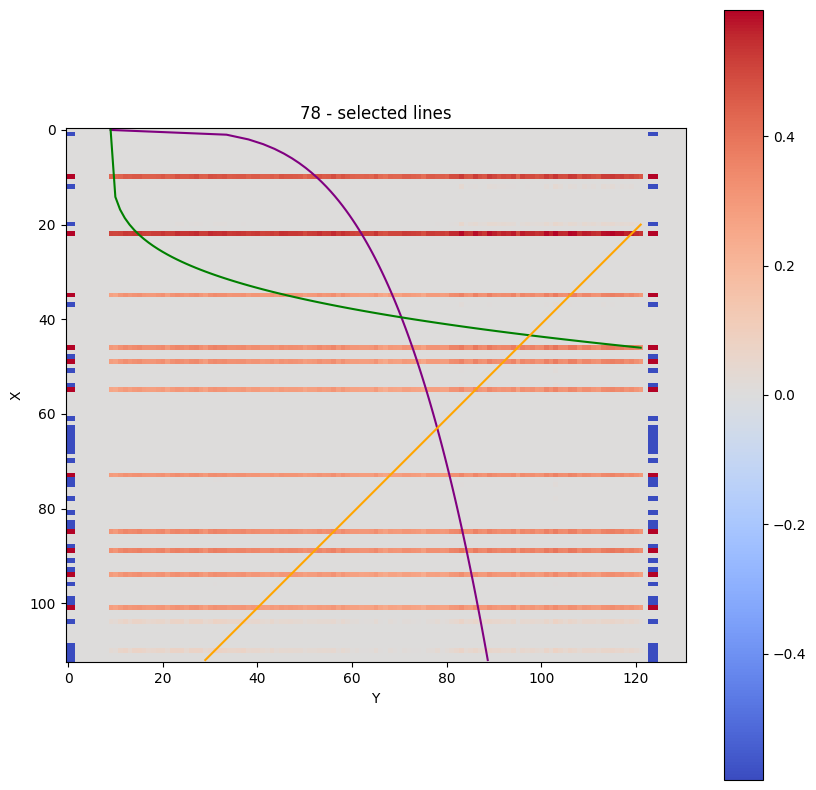

In [65]:
fig, ax = plt.subplots(figsize=(10,10))
to_plot = unembed_original[:,78].reshape(113,113).detach().cpu().numpy()
quick_plot_4(ax, to_plot, "78 - selected lines", V=1, V12keep = \
             get_indices(E3_right, -1)+get_indices(E3_right, 1))

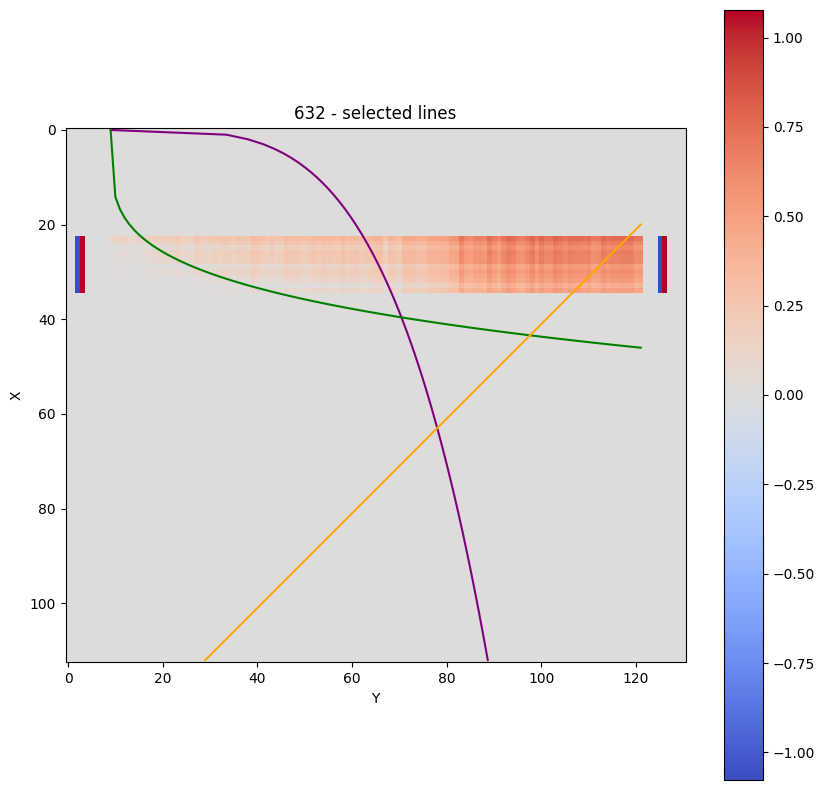

In [66]:
fig, ax = plt.subplots(figsize=(10,10))
to_plot = unembed_original[:,632].reshape(113,113).detach().cpu().numpy()


quick_plot_4(ax, to_plot, "632 - selected lines", V=1, V12keep = \
             get_indices(E0_right, 1,23,35))



# 8.5) Addition
messy, needs to be checked.

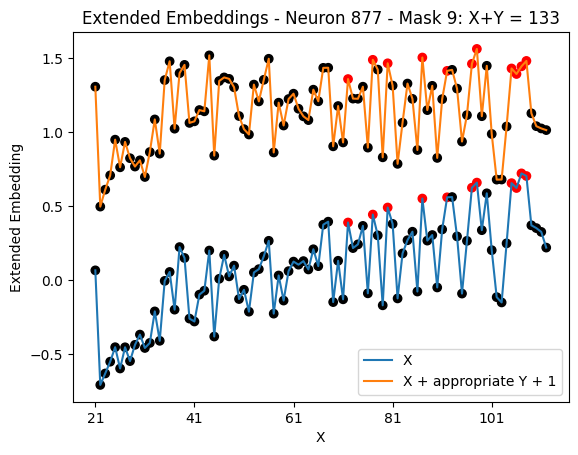

In [166]:
import matplotlib.ticker as ticker

figs, axs = [], []

def custom_formatter(x, pos):
    return f'{int(x+21)}'

# iterate thru each mask
for j in [9]:
    # Create a new figure and axes for each plot
    fig, ax = plt.subplots()
    figs.append(fig)
    axs.append(ax)

    ax.scatter(list(range(21-21,113-21)),VOMs_weighted_all_np[21:113, 877, 0],c=colors[rules_3.astype(int)[j][21:113]])
    ax.plot(VOMs_weighted_all_np[21:113, 877, 0],label="X")
    
    ax.scatter(list(range(21-21,113-21)),VOMs_weighted_all_np[21:113, 877, 0]+VOMs_weighted_all_np[112:20:-1, 877, 1]+1,c=colors[rules_3.astype(int)[j][21:113]])
    ax.plot(VOMs_weighted_all_np[21:113, 877, 0]+VOMs_weighted_all_np[112:20:-1, 877, 1]+1,label="X + appropriate Y + 1")

    ax.legend()

    ax.set_title(f"Extended Embeddings - Neuron 877 - Mask {j}: X+Y = 133")

    ax.set_xlabel('X')
    ax.set_ylabel("Extended Embedding")
    ax.xaxis.set_major_formatter(ticker.FuncFormatter(custom_formatter))  # Use custom formatter for x-axis
    plt.show()


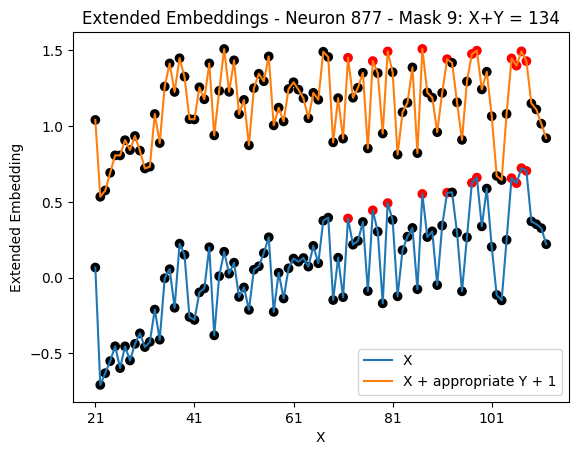

In [165]:
import matplotlib.ticker as ticker

figs, axs = [], []

def custom_formatter(x, pos):
    return f'{int(x+21)}'

# iterate thru each mask
for j in [9]:
    # Create a new figure and axes for each plot
    fig, ax = plt.subplots()
    figs.append(fig)
    axs.append(ax)

    ax.scatter(list(range(21-21,113-21)),VOMs_weighted_all_np[21:113, 877, 0],c=colors[rules_3.astype(int)[j][21:113]])
    ax.plot(VOMs_weighted_all_np[21:113, 877, 0],label="X")
    
    ax.scatter(list(range(21-21,113-21)),VOMs_weighted_all_np[21:113, 877, 0]+VOMs_weighted_all_np[113:21:-1, 877, 1]+1,c=colors[rules_3.astype(int)[j][21:113]])
    ax.plot(VOMs_weighted_all_np[21:113, 877, 0]+VOMs_weighted_all_np[113:21:-1, 877, 1]+1,label="X + appropriate Y + 1")

    ax.legend()

    ax.set_title(f"Extended Embeddings - Neuron 877 - Mask {j}: X+Y = 134")

    ax.set_xlabel('X')
    ax.set_ylabel("Extended Embedding")
    ax.xaxis.set_major_formatter(ticker.FuncFormatter(custom_formatter))  # Use custom formatter for x-axis
    plt.show()


In [175]:
ceiled_y_dependent = [int(math.ceil(num)) for num in y_dependent]

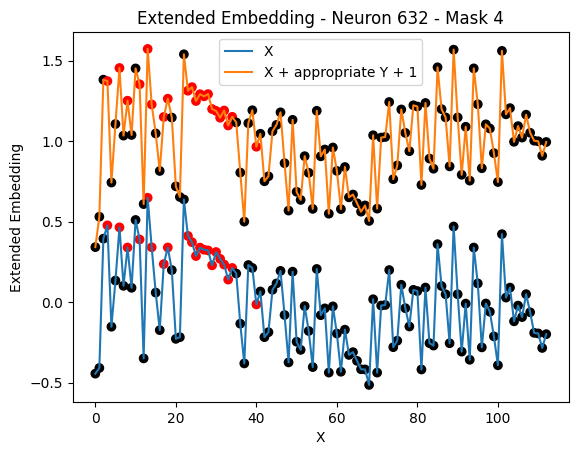

In [186]:
import matplotlib.ticker as ticker

figs, axs = [], []


# iterate thru each mask
for j in [4]:
    # Create a new figure and axes for each plot
    fig, ax = plt.subplots()
    figs.append(fig)
    axs.append(ax)

    ax.scatter(list(range(0,113)),VOMs_weighted_all_np[:-1, 632, 0],c=colors[rules_3.astype(int)[j][:]])
    ax.plot(VOMs_weighted_all_np[:-1, 632, 0],label="X")
    
    ax.scatter(list(range(0,113)),VOMs_weighted_all_np[:-1, 632, 0]+VOMs_weighted_all_np[ceiled_y_dependent, 632, 1]+1,c=colors[rules_3.astype(int)[j][:]])
    ax.plot(VOMs_weighted_all_np[:-1, 632, 0]+VOMs_weighted_all_np[ceiled_y_dependent, 632, 1]+1,label="X + appropriate Y + 1")

    ax.legend()

    ax.set_title(f"Extended Embedding - Neuron 632 - Mask {j}")

    ax.set_xlabel('X')
    ax.set_ylabel("Extended Embedding")
    plt.show()

# 9) Not in write-up


## Red lefts 
seem to matter for rows with 2 color swaps - look at masks 3 and 8.
3 is RBBRxx
8 is xxBRRB

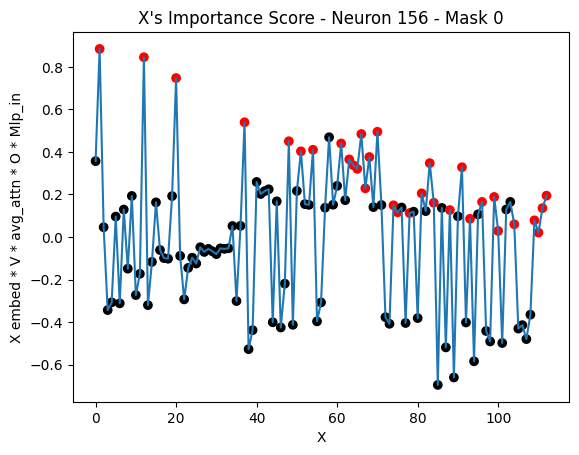

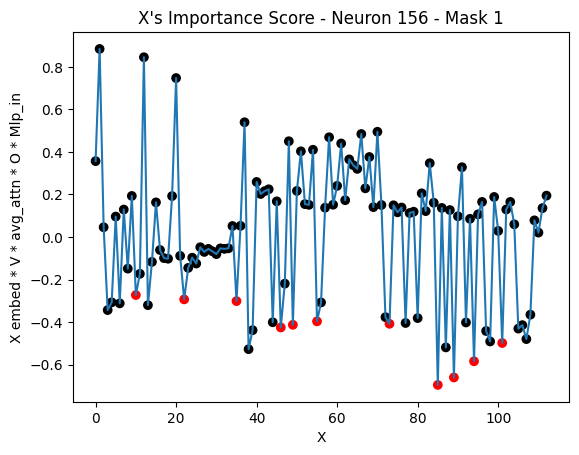

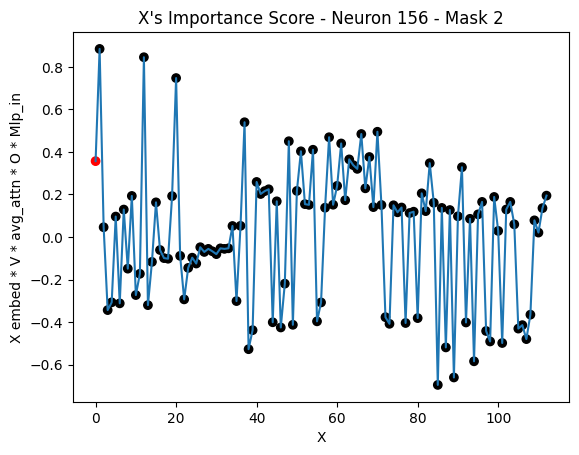

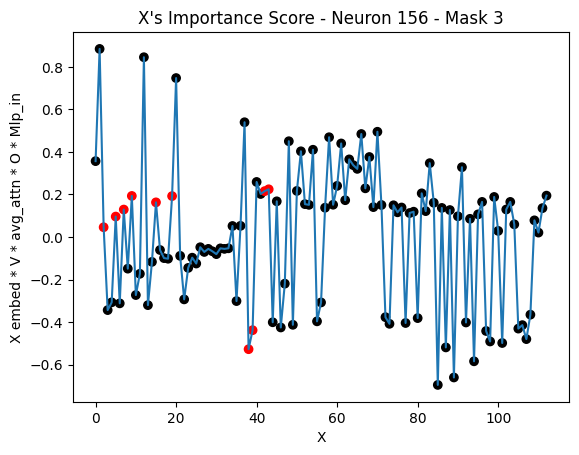

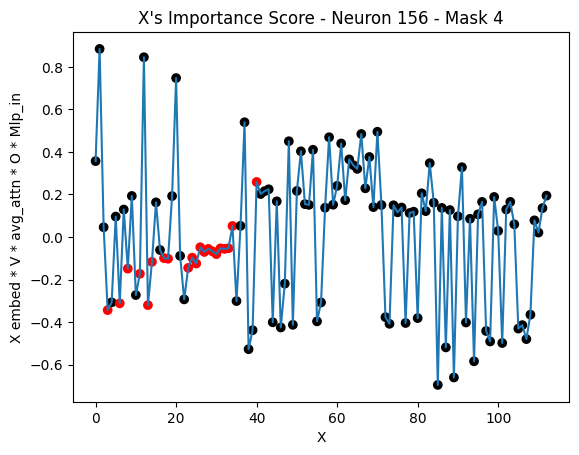

...

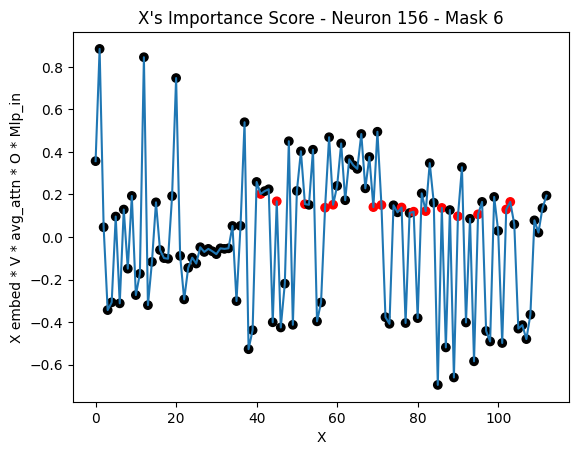

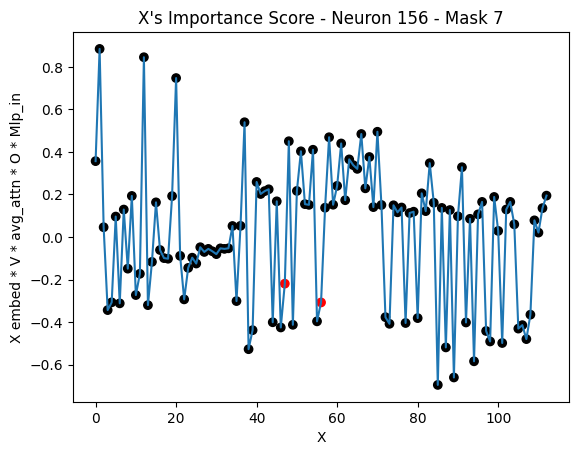

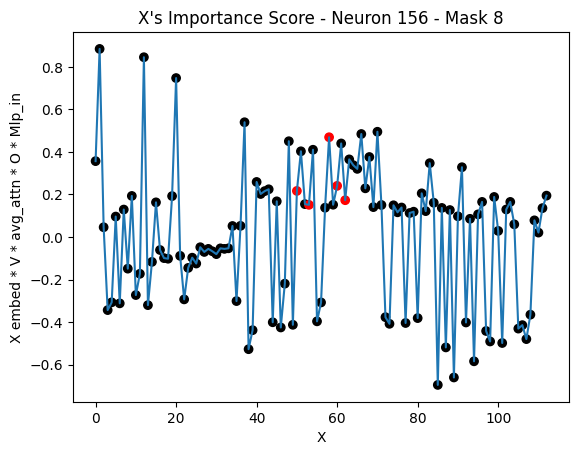

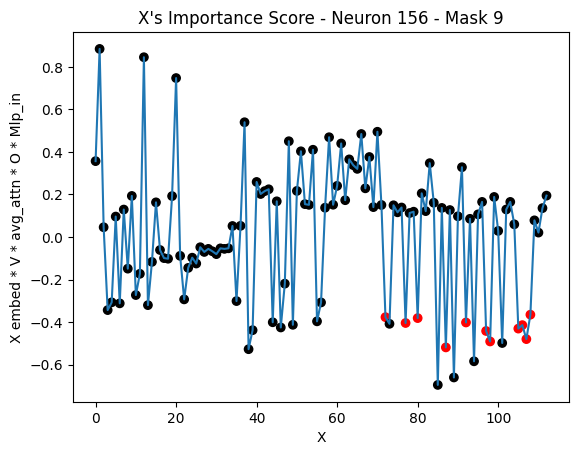

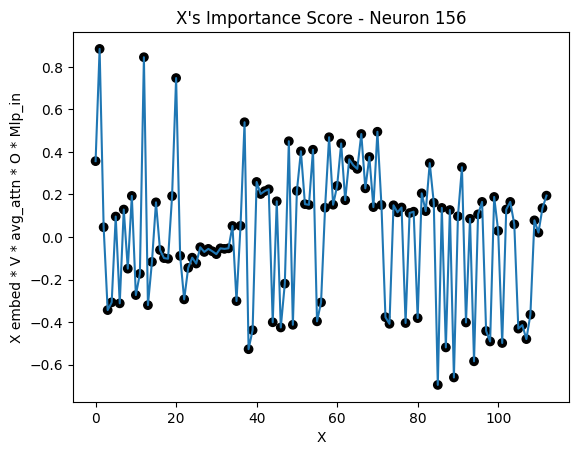

In [67]:
import matplotlib.pyplot as plt
import numpy as np

colors = np.array(['black', 'red'])

VOMs_weighted_all_np = VOMs_weighted_all.detach().cpu().numpy()
# VOMs_weighted_all_rollup_np = VOMs_weighted_all_rollup.detach().cpu().numpy()

figs, axs = [], []

for i in [156]:
    # iterate thru each mask
    for j in range(10):
        # Create a new figure and axes for each plot
        fig, ax = plt.subplots()
        figs.append(fig)
        axs.append(ax)

        ax.scatter(list(range(113)),VOMs_weighted_all_np[:-1, i, 0],c=colors[rules_3.astype(int)[j]])
        ax.plot(VOMs_weighted_all_np[:-1, i, 0])


        ax.set_title(f"X's Extended Embedding - Neuron {i} - Mask {j}")

        ax.set_xlabel('X')
        ax.set_ylabel('Extended Embedding')

        plt.show()
    # Create a new figure and axes for each plot
    fig, ax = plt.subplots()
    figs.append(fig)
    axs.append(ax)

    ax.scatter(list(range(113)),VOMs_weighted_all_np[:-1, i, 0],c=np.array(['black', 'black'])[rules_3.astype(int)[j]])
    ax.plot(VOMs_weighted_all_np[:-1, i, 0])


    ax.set_title(f"X's Extended Embedding - Neuron {i}")

    ax.set_xlabel('X')
    ax.set_ylabel('Extended Embedding')

    plt.show()

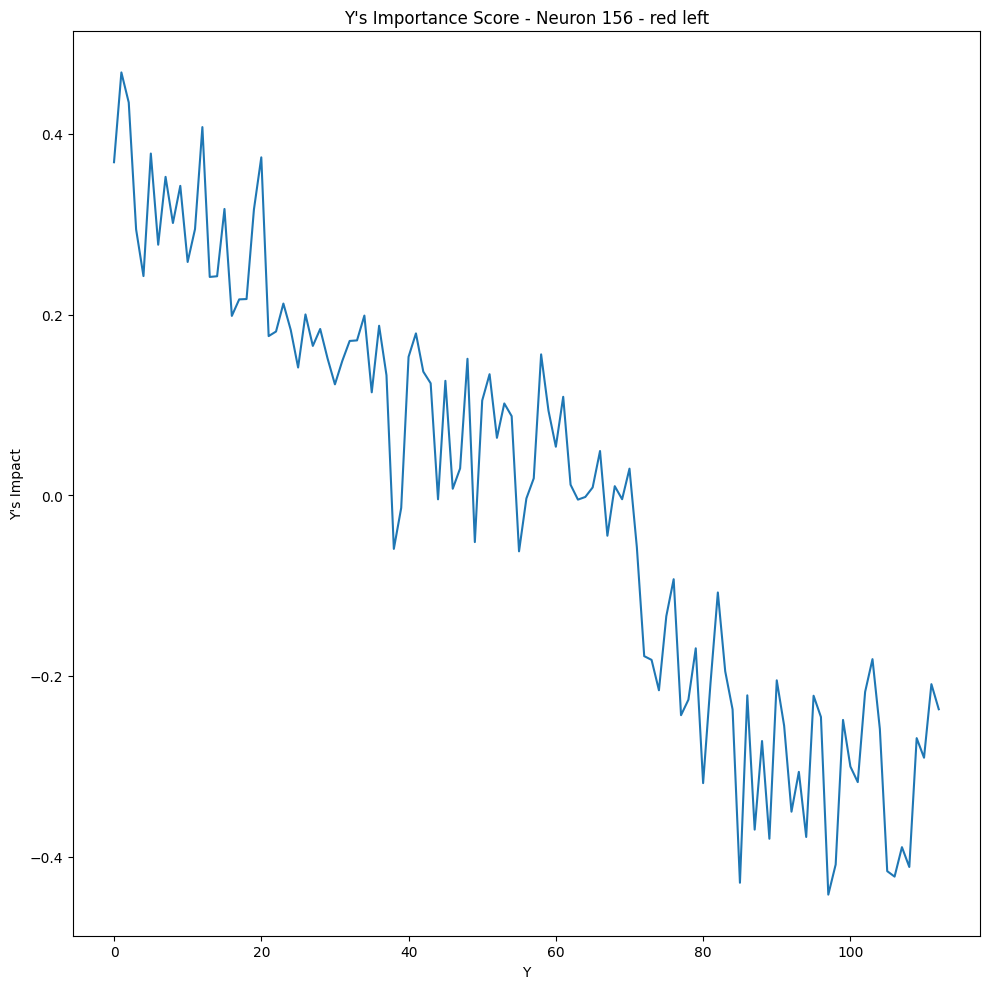

In [68]:
import numpy as np

fig, axs = plt.subplots(1, 1, figsize=(10,10)) # 2 rows, 2 columns



for i, index in enumerate([156]):
    axs.plot(VOMs_weighted_all_np[:-1, index, 1])
    axs.set_xlabel("Y")
    axs.set_ylabel("Extended Embedding")

axs.set_title(f"Y's Extended Embedding - Neuron 156 - red left")




# Display all plots in the 2x2 grid
plt.tight_layout()
plt.show()

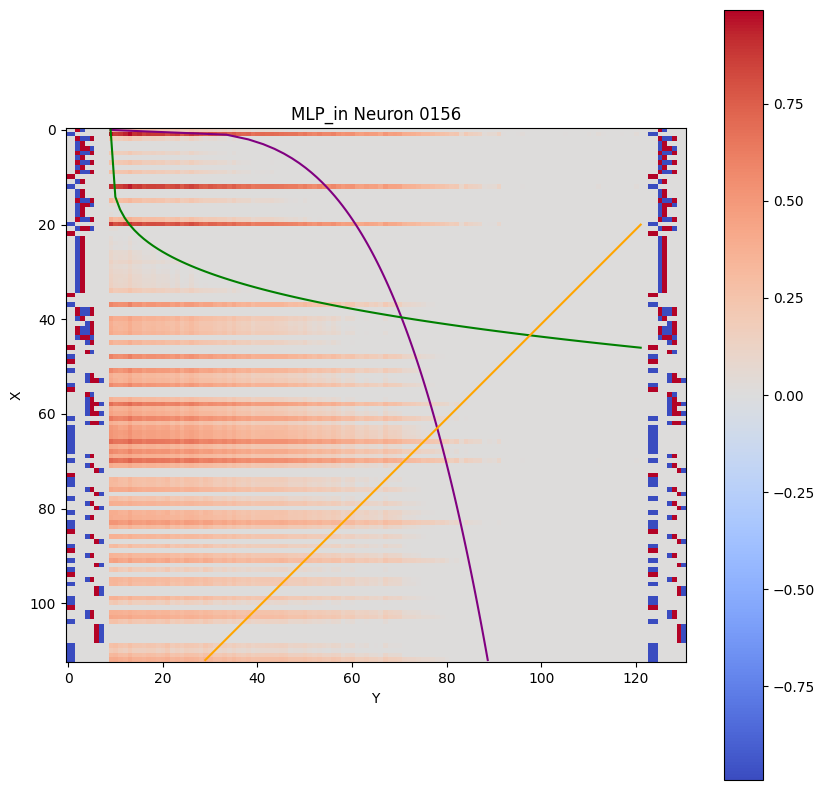

In [32]:
for i in [156]:
    to_plot = unembed_original[:,i].reshape(113,113).detach().cpu().numpy()

    formatted_i = "MLP_in Neuron {:04d}".format(i)

    overall += to_plot

    title = formatted_i


    fig, ax = plt.subplots(figsize=(10,10))
    quick_plot_4(ax, to_plot, title, V=v)
    plt.show()



## each head's MLP impact on final output.

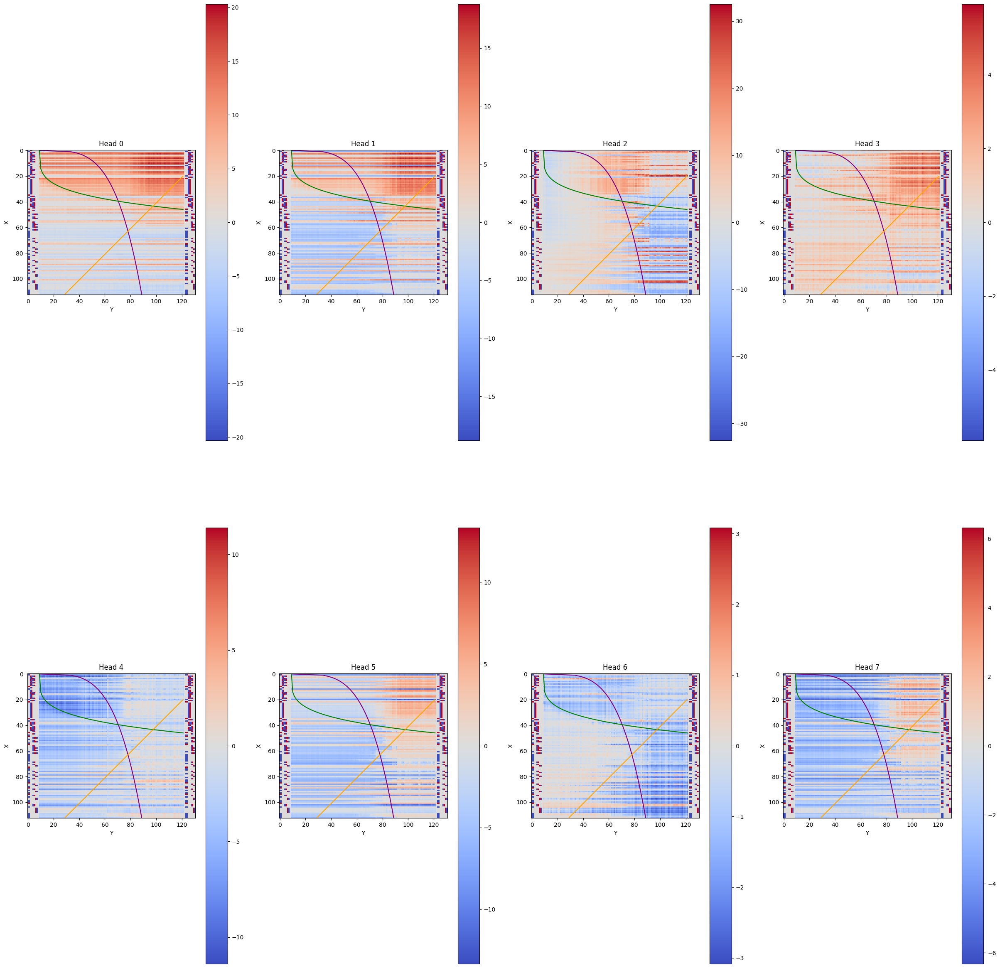

In [69]:
fig, axs = plt.subplots(2,4, figsize=(30,30)) 
axs = axs.flatten() # Flatten to easily index into axs

for i in range(8):
    to_plot = original_mlp_out_attn_unembed[:,i].reshape(113,113).detach().cpu().numpy()

    formatted_i = "Head {:01d}".format(i)

    quick_plot_4(axs[i], to_plot, formatted_i, V=0)

## Addition for all BRs and RRs

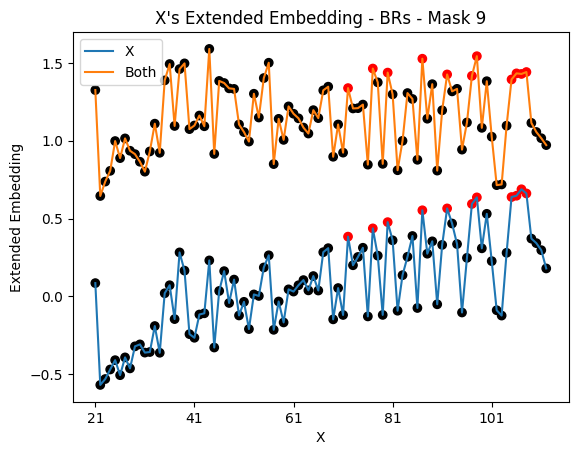

In [187]:
import matplotlib.ticker as ticker

figs, axs = [], []

def custom_formatter(x, pos):
    return f'{int(x+21)}'

# iterate thru each mask
for j in [9]:
    # Create a new figure and axes for each plot
    fig, ax = plt.subplots()
    figs.append(fig)
    axs.append(ax)

    ax.scatter(list(range(21-21,113-21)),np.mean(VOMs_weighted_all_np[21:113, BR, 0],axis=1),c=colors[rules_3.astype(int)[j][21:113]])
    ax.plot(np.mean(VOMs_weighted_all_np[21:113, BR, 0],axis=1),label="X")
    
    ax.scatter(list(range(21-21,113-21)),np.mean(VOMs_weighted_all_np[21:113, BR, 0],axis=1)+np.mean(VOMs_weighted_all_np[112:20:-1, BR, 1],axis=1)+1,c=colors[rules_3.astype(int)[j][21:113]])
    ax.plot(np.mean(VOMs_weighted_all_np[21:113, BR, 0],axis=1)+np.mean(VOMs_weighted_all_np[112:20:-1, BR, 1],axis=1)+1,label="Both")

    ax.legend()
    ax.set_title(f"X's Extended Embedding - BRs - Mask {j}")

    ax.set_xlabel('X')
    ax.set_ylabel("Extended Embedding")
    ax.xaxis.set_major_formatter(ticker.FuncFormatter(custom_formatter))  # Use custom formatter for x-axis
    plt.show()



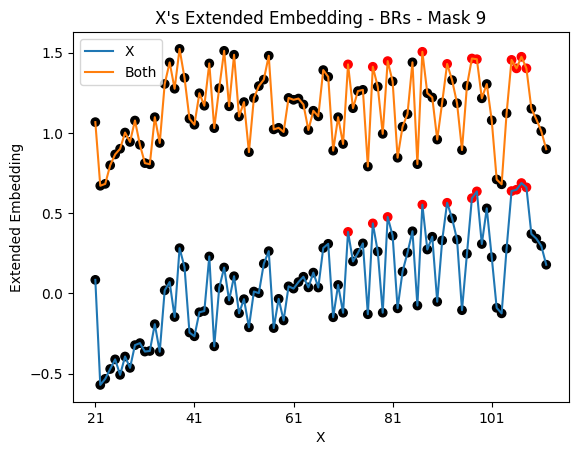

In [168]:
import matplotlib.ticker as ticker

figs, axs = [], []

def custom_formatter(x, pos):
    return f'{int(x+21)}'

# iterate thru each mask
for j in [9]:
    # Create a new figure and axes for each plot
    fig, ax = plt.subplots()
    figs.append(fig)
    axs.append(ax)

    ax.scatter(list(range(21-21,113-21)),np.mean(VOMs_weighted_all_np[21:113, BR, 0],axis=1),c=colors[rules_3.astype(int)[j][21:113]])
    ax.plot(np.mean(VOMs_weighted_all_np[21:113, BR, 0],axis=1),label="X")
    
    ax.scatter(list(range(21-21,113-21)),np.mean(VOMs_weighted_all_np[21:113, BR, 0],axis=1)+np.mean(VOMs_weighted_all_np[113:21:-1, BR, 1],axis=1)+1,c=colors[rules_3.astype(int)[j][21:113]])
    ax.plot(np.mean(VOMs_weighted_all_np[21:113, BR, 0],axis=1)+np.mean(VOMs_weighted_all_np[113:21:-1, BR, 1],axis=1)+1,label="Both")

    ax.legend()
    ax.set_title(f"X's Extended Embedding - BRs - Mask {j}")

    ax.set_xlabel('X')
    ax.set_ylabel("Extended Embedding")
    ax.xaxis.set_major_formatter(ticker.FuncFormatter(custom_formatter))  # Use custom formatter for x-axis
    plt.show()


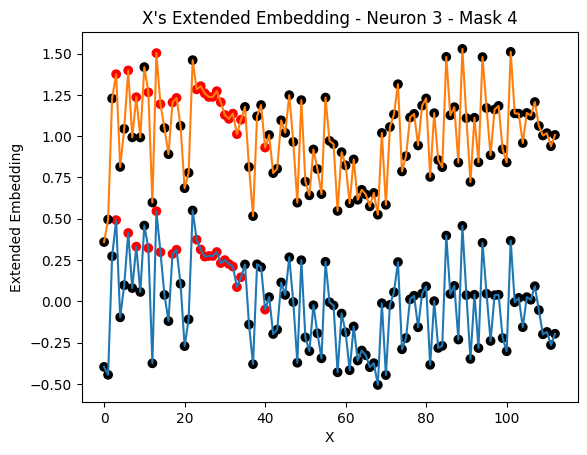

In [183]:
import matplotlib.ticker as ticker

figs, axs = [], []

def custom_formatter(x, pos):
    return f'{int(x+21)}'

# iterate thru each mask
for j in [4]:
    # Create a new figure and axes for each plot
    fig, ax = plt.subplots()
    figs.append(fig)
    axs.append(ax)

    ax.scatter(list(range(0,113)),np.mean(VOMs_weighted_all_np[0:-1, RR, 0],axis=1),c=colors[rules_3.astype(int)[j][:]])
    ax.plot(np.mean(VOMs_weighted_all_np[0:-1, RR, 0],axis=1))
    
    ax.scatter(list(range(0,113)),np.mean(VOMs_weighted_all_np[0:-1, RR, 0],axis=1)+np.mean(VOMs_weighted_all_np[:, RR, 1],axis=1)[ceiled_y_dependent]+1,c=colors[rules_3.astype(int)[j][:]])
    ax.plot(np.mean(VOMs_weighted_all_np[0:-1, RR, 0],axis=1)+np.mean(VOMs_weighted_all_np[:, RR, 1],axis=1)[ceiled_y_dependent]+1)

    
    
    ax.set_title(f"X's Extended Embedding - Neuron {i} - Mask {j}")

    ax.set_xlabel('X')
    ax.set_ylabel("Extended Embedding")
#     ax.xaxis.set_major_formatter(ticker.FuncFormatter(custom_formatter))  # Use custom formatter for x-axis
    plt.show()